#### In this file, the names of the sections follow the ones in the pdf report

In [2]:
import numpy as np
import pandas as pd
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=FutureWarning)
import scipy.stats as stats
from scipy.stats import zscore, t, kendalltau, chi2
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import ta
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from imblearn.under_sampling import RandomUnderSampler
import networkx as nx
import colorsys

# 2) Preliminary Checks

In [3]:
market = pd.read_csv("/Users/Giulio/Library/Mobile Documents/com~apple~CloudDocs/Work/Quant/Point72 take-home project/Material received/proj_data/market.csv")          
market["dates"] = pd.to_datetime(market["dates"])

In [4]:
est1 = pd.read_csv("/Users/Giulio/Library/Mobile Documents/com~apple~CloudDocs/Work/Quant/Point72 take-home project/Material received/proj_data/estimate1.csv")
est2 = pd.read_csv("/Users/Giulio/Library/Mobile Documents/com~apple~CloudDocs/Work/Quant/Point72 take-home project/Material received/proj_data/estimate2.csv")
est3 = pd.read_csv("/Users/Giulio/Library/Mobile Documents/com~apple~CloudDocs/Work/Quant/Point72 take-home project/Material received/proj_data/estimate3.csv")         
est1["dates"] = pd.to_datetime(est1["dates"])
est2["dates"] = pd.to_datetime(est2["dates"])
est3["dates"] = pd.to_datetime(est3["dates"])

### 2.1) Checks on Market Data

In [5]:
# "market" contains a row with three nulls
market[market.isnull().any(axis=1)]

,dates,ticker,Close,High,Low,Open,volumeUSD
81090,2001-05-18,S80,19.43119,NaN,NaN,NaN,1.949078e+08


In [6]:
# I perform linear interpolation to impute these three values
market.set_index("dates", inplace=True)
market[["High", "Low", "Open"]] = market[["High", "Low", "Open"]].interpolate(method="linear")
market.reset_index(inplace=True)

In [7]:
# No negative values for price or volume 
len(market[(market[["Close", "High", "Low", "Open", "volumeUSD"]] < 0).any(axis=1)])        

0

In [8]:
# The tickers are grouped and sorted as expected
def are_tickers_in_order(df):
    ticker_order = df["ticker"].tolist()
    return ticker_order == sorted(ticker_order, key=lambda x: int(x[1:]))
are_tickers_in_order(market)

True

In [9]:
# Dates are in increasing order for all tickers
def are_dates_in_order(df):
    grouped_df = df.groupby("ticker")
    is_date_order_maintained = True
    for ticker, group in grouped_df:
        if not group["dates"].is_monotonic_increasing:
            return False
    return True

are_dates_in_order(market)

True

In [10]:
# All tickers contain the same dates
grouped_market = market.groupby("ticker")
common_dates = None
    
for ticker, group in grouped_market:
    unique_dates = set(group["dates"])
    if common_dates is None:
        common_dates = unique_dates
    elif common_dates != unique_dates:
        common_dates = common_dates.intersection(unique_dates)

common_dates == set(market["dates"])

True

In [11]:
all_tickers = market["ticker"].unique()

In [12]:
# I check the correlations between pairs of stocks. To do so, I first create a table with 101 
# columns ("dates" + 100 columns for the close prices of the 100 stocks). I name these columns 
# by the corresponding ticker

market_by_ticker = market.pivot(index="dates", columns="ticker", values="Close")
market_by_ticker.columns = [str(col) for col in market_by_ticker.columns]
sorted_columns = sorted(market_by_ticker.columns, key=lambda x: int(x[1:]))
market_by_ticker = market_by_ticker[sorted_columns]
market_by_ticker.reset_index(inplace=True)

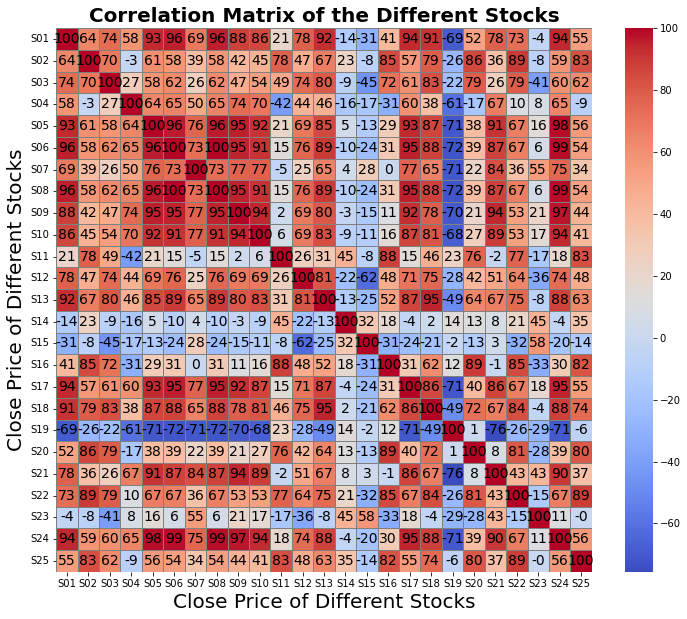

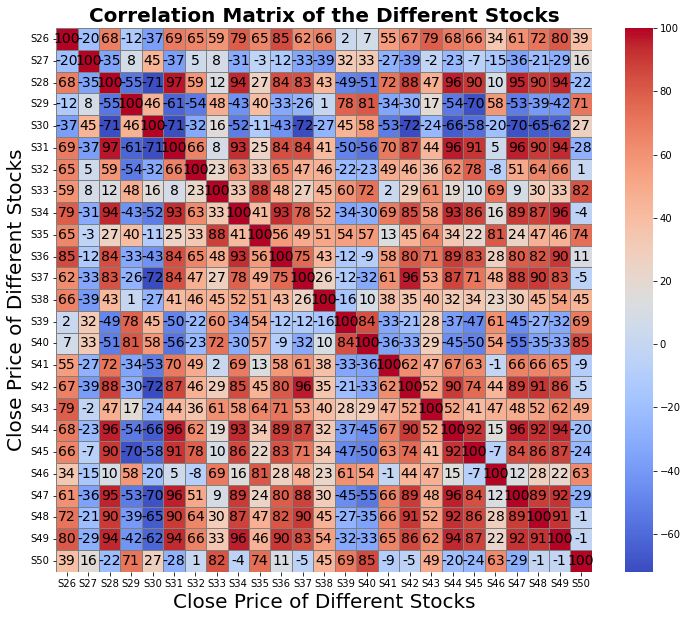

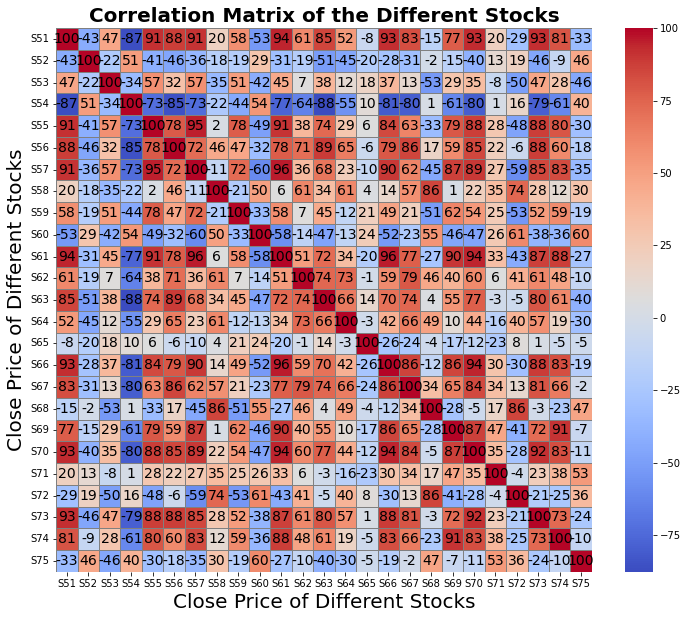

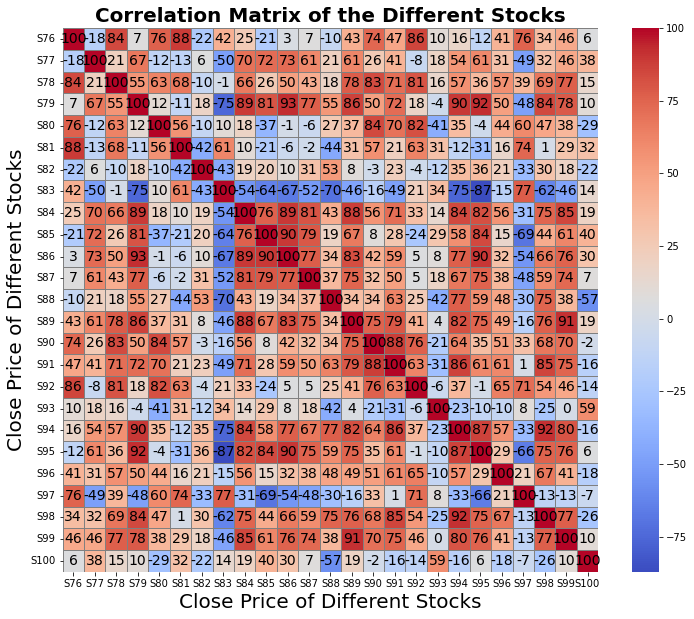

In [13]:
# I now create and plot the 4 correlation matrices in Figure 1
for i in range(1,101,25):
    stocks_corr_matrix = market_by_ticker.iloc[:, i:i+25].corr() * 100 
    
    fig = plt.figure(figsize=(12, 10))
    fig.patch.set_facecolor("white")

    sns.heatmap(stocks_corr_matrix, annot=True, fmt='.0f', cmap="coolwarm", cbar=True, 
    annot_kws={"color": "black", "fontsize": 14}, linewidths=0.5, linecolor="gray")
    
    plt.title("Correlation Matrix of the Different Stocks", color="black", fontsize=20, weight="bold")      
    plt.xlabel("Close Price of Different Stocks", color="black", fontsize=20)
    plt.ylabel("Close Price of Different Stocks", color="black", fontsize=20)

    ax = plt.gca()
    ax.set_facecolor("white")
    ax.tick_params(axis="x", colors="black", labelrotation=0, labelsize=10)
    ax.tick_params(axis="y", colors="black", labelrotation=0, labelsize=10)
    for spine in ax.spines.values():
        spine.set_edgecolor("black")
        spine.set_linewidth(1)
    plt.show()

### Checks on Estimate Data

In [14]:
# These three datasets do not contain any missing values
est1.isna().any().any() | est2.isna().any().any() | est3.isna().any().any()

False

In [15]:
# They do not contain any negative value
check1 = all(est1.drop(columns=["dates", "ticker"]).ge(0).all().values)
check2 = all(est2.drop(columns=["dates", "ticker"]).ge(0).all().values)
check3 = all(est3.drop(columns=["dates", "ticker"]).ge(0).all().values)
check1 & check2 & check3

True

In [16]:
# Their maximum values are low enough not to suggest entry errors
print(est1.drop(columns=["dates", "ticker"]).max().max())
print(est2.drop(columns=["dates", "ticker"]).max().max())
print(est3.drop(columns=["dates", "ticker"]).max().max())

23
38
10


In [17]:
# The three datasets are sorted chronologically
check4 = all(group["dates"].is_monotonic_increasing for x, group in est1.groupby("ticker"))
check5 = all(group["dates"].is_monotonic_increasing for x, group in est2.groupby("ticker"))
check6 = all(group["dates"].is_monotonic_increasing for x, group in est3.groupby("ticker"))
check4 & check5 & check6

True

In [18]:
# The tickers are grouped and sorted as expected
are_tickers_in_order(est1) & are_tickers_in_order(est2) & are_tickers_in_order(est3)

True

In [19]:
# The dates are in chronological order for all tickers in all three "estimate" datasets
are_dates_in_order(est1) & are_dates_in_order(est2) & are_dates_in_order(est3)

True

# 3) Feature Engineering

### 3.1) Technical Indicators

In [20]:
# This function computes the technical indicators by ticker. Please refer to the report for the 
# details (e.g., what each variable measures, how null values are imputed, etc)

def add_features(df_ticker):
    """
    This function takes a DataFrame for a single ticker and adds the indicators as columns 
    """
    df = df_ticker.copy()
    prices = df["Close"]
    
    # Approximate number of shares traded
    df["Shares_traded"] = df["volumeUSD"] / prices
    
    # Day-by-day return
    df["Return"] = prices.pct_change().fillna(0)
    
    # Exponentially weighted volatility (standard deviation of returns)      
    df["Volatility"] = df["Return"].ewm(span=20).std().fillna(0)
    
    # Normalised difference between exponential moving averages
    ema_10 = ta.trend.EMAIndicator(close=df["Close"], window=10, fillna=True).ema_indicator()
    ema_30 = ta.trend.EMAIndicator(close=df["Close"], window=30, fillna=True).ema_indicator()
    df["EMA_diff"] = (ema_10 - ema_30) / prices
    
    # Momentum (using MACD)
    macd_indicator = ta.trend.MACD(
        close=df["Close"], window_slow=24, window_fast=12, window_sign=9, fillna=True)
    hist_series = macd_indicator.macd_diff()
    df["MACD_momentum"] = np.where((hist_series > 0) & (hist_series.diff() > 0), 2,
        np.where((hist_series > 0) & (hist_series.diff() <= 0), 1,
        np.where((hist_series < 0) & (hist_series.diff() < 0), -2,
        np.where((hist_series < 0) & (hist_series.diff() >= 0), -1,
                    0))))
    
    # Relative strength index
    df["RSI"] = ta.momentum.RSIIndicator(close=df["Close"], window=14, fillna=True).rsi()
    
    # Bollinger bands binary variables
    bb_indicator = ta.volatility.BollingerBands(close=df["Close"], window=20, 
                                                window_dev=2, fillna=True)            
    bb_upper = bb_indicator.bollinger_hband()
    bb_lower = bb_indicator.bollinger_lband()
    df["Bol_up"] = (prices > bb_upper).astype(int)
    df["Bol_down"] = (prices < bb_lower).astype(int)
    
    # Stochastic oscillator signal
    stoch_indicator = ta.momentum.StochasticOscillator(high=df["High"], low=df["Low"], 
                      close=df["Close"], window=14, smooth_window=3, fillna=True)             
    df["Stoch_osc_signal"] = stoch_indicator.stoch() - stoch_indicator.stoch_signal()
    
    # Commodity channel index
    df["CCI"] = cci_indicator = ta.trend.CCIIndicator(
        high=df["High"], low=df["Low"], close=df["Close"], window=20, fillna=True).cci()
    
    # On-balance volume
    df["OBV"] = ta.volume.OnBalanceVolumeIndicator(close=df["Close"], volume=df["volumeUSD"], 
             fillna=True).on_balance_volume() / df["volumeUSD"]       
    
    # Money flow index
    df["MFI"] = ta.volume.MFIIndicator(high=df["High"], low=df["Low"], close=df["Close"], 
                volume=df["volumeUSD"], window=14, fillna=True).money_flow_index()
    
    # Parabolic Stock and Reverse (SAR)
    df["PSAR"] = ta.trend.PSARIndicator(high=df["High"], low=df["Low"], close=df["Close"]
                 ).psar() / prices
    
    return df

In [21]:
# Now I apply the above function to every ticker separately, adding the new varaibles to "market"
market = market.groupby("ticker", group_keys=False).apply(add_features)

### 3.2) Sentiment Scores

In [22]:
# This function is required for the "sentiment_score()" function to work properly
# Indeed, the newly created sentiment variables must clearly have a value for every 
# stock on every day, even when that stock is not present in an estimate dataset
def add_missing_tickers(est):
    """
    Adds missing tickers to the dataset "est" by inserting a row with 0's
    for all variables except "ticker" and "date" (which could be any date). 
    The original order of rows is preserved.
    """
    # First I identify the missing tickers
    existing_tickers = set(est['ticker'])
    missing_tickers = set(all_tickers) - existing_tickers
    
    # Then I add a row for each missing ticker
    for ticker in missing_tickers:
        new_row = {"dates":market["dates"].iloc[0], "ticker":ticker, "NumEst":0, "NumEst3M":0, 
                   "NumEst4W":0, "NumEstLowered1M":0, "NumEstLowered1W":0, "NumEstLowered4W":0, 
                   "NumEstRaised1M":0, "NumEstRaised1W":0, "NumEstRaised4W":0}
        new_row_df = pd.DataFrame([new_row])
        new_row_df = new_row_df.dropna(how='all', axis=1)  # Drop columns that are all-NA
        est = pd.concat([est, new_row_df], ignore_index=True)
    
    # Lastly I ensure the dataset is sorted first by "ticker" and then by "date"     
    est = est.sort_values(by=["ticker", "dates"], 
    key=lambda col: col.str.extract(r'(\d+)')[0].astype(int) if col.name == "ticker" else col
    ).reset_index(drop=True)

    return est

In [23]:
est1 = add_missing_tickers(est1)
est2 = add_missing_tickers(est2)
est3 = add_missing_tickers(est3)

In [24]:
all_days = market[market["ticker"]=="S01"].set_index("dates").index

In [25]:
# This function extracts a sentiment score from the portion of an estimate dataset
# corresponding to a single ticker
def sentiment_score(df_single_ticker):
    """
    "df_single_ticker" if the portion of an estimate dataset referring to a single ticker.
    """
    df = df_single_ticker.set_index("dates")
    
    # I first reindex using all days in "market". Missing days get NaN in the columns
    df = df.reindex(all_days)
    
    groups = ["1W", "4W", "1M"]  # these are the three subgroups, as defined in the report
    for group in groups:
        # Nothing changed in the days for which we have no data
        # So, on these days, no estimates were raised nor lower
        df[f"NumEstLowered{group}"] = df[f"NumEstLowered{group}"].fillna(0)
        df[f"NumEstRaised{group}"] = df[f"NumEstRaised{group}"].fillna(0)
        # Here I compute the sentiment score for each subgroup
        negative_score = np.array(df[f"NumEstLowered{group}"].cumsum())
        positive_score = np.array(df[f"NumEstRaised{group}"].cumsum())                  
        df[f"{group}Score"] = np.array([
            (positive_score[i] - negative_score[i]) / (positive_score[i] + negative_score[i])           
            if (positive_score[i] + negative_score[i]) != 0 else 0
            for i in range(len(df))])
    # The overall score for the estimate dataset is simply the average between the scores
    # of the 3 subgroups
    df["Score"] = df[["1WScore", "4WScore", "1MScore"]].mean(axis=1)
    
    # I reset the index so the dates become a regular column
    df = df.reset_index().rename(columns={"index": "dates"})
    
    ticker_here = list(df["ticker"].dropna())[0]
    df["ticker"] = df["ticker"].fillna(ticker_here)
    
    return df

In [26]:
# Now I carry out the above procedure by ticker for each of the 3 estimate datasets
# The newly created "ticker_numeric" variable makes this easier. It is 1 for "S01", 2 for "S02", etc   
est1["ticker_numeric"] = est1["ticker"].str.extract(r'(\d+)').astype(int)
est1 = est1.groupby("ticker_numeric", group_keys=False).apply(sentiment_score)
est2["ticker_numeric"] = est2["ticker"].str.extract(r'(\d+)').astype(int)
est2 = est2.groupby("ticker_numeric", group_keys=False).apply(sentiment_score)
est3["ticker_numeric"] = est3["ticker"].str.extract(r'(\d+)').astype(int)
est3 = est3.groupby("ticker_numeric", group_keys=False).apply(sentiment_score)

In [27]:
# Now I add the 3 sentiment score variables to the "market" dataset
market["Score1"] = np.array(est1["Score"])
market["Score2"] = np.array(est2["Score"])
market["Score3"] = np.array(est3["Score"])

# 4) Creating the Target Variable

In [28]:
#### Sometimes the order in which actions need to be performed is not the same as the order 
#### in which it makes sense to describe them. 
#### This is the reason why, in this file, section 4.3 comes before 4.1 and 4.2.

### 4.3) Smoothing

In [29]:
# This is a helper function that merges any short, isolated runs of a position with the 
# surrounding runs if they share the same value. Its purpose is to make the target variable 
# less volatile
def remove_short_runs(positions, min_run_length=20):
    """
    Given an integer array of positions (..., -1, 0, +1, ...), this function merges/removes 
    short runs that are strictly shorter than "min_run_length" if they are sandwiched by 
    runs of the same position on both sides.

    It returns a new numpy array of the same shape.
    """
    positions = positions.copy()
    n = len(positions)
    if n < 2:
        return positions  # This is the trivial case

    # 1) First I identify consecutive runs, defining them as (start_index, end_index, value)
    runs = []
    start = 0
    current_val = positions[0]
    for i in range(1, n):
        if positions[i] != current_val:
            runs.append((start, i - 1, current_val))
            start = i
            current_val = positions[i]
    # append the last run
    runs.append((start, n - 1, current_val))

    # Then I merge out short runs if they are between two runs of the same value
    processed = []
    i = 0
    while i < len(runs):
        start_i, end_i, val_i = runs[i]
        length_i = (end_i - start_i + 1)

        # If this run is short and has both a prev and next run
        if length_i < min_run_length and i > 0 and i < len(runs) - 1:
            start_prev, end_prev, val_prev = processed[-1]  # last merged run
            start_next, end_next, val_next = runs[i + 1]

            # If the runs to the left and right have the same value,
            # I flatten the short run to that same value
            if val_prev == val_next:
                merged_run = (start_prev, end_next, val_prev)
                processed[-1] = merged_run
                i += 2
                continue
        processed.append(runs[i])
        i += 1

    #  Finally I convert merged runs back into a positions array
    new_positions = np.zeros_like(positions)
    for (start_idx, end_idx, v) in processed:
        new_positions[start_idx:end_idx+1] = v

    return new_positions

### 4.1) First Approach: Linear Regression with Significance Test

In [30]:
# This function fits a linear regression on the next "lookahead" close prices to classify the 
# future trend as bullish (+1), bearish (-1), or flat (0). I end up using the function
# "compute_position_kt()" to define my target variable, but I anyway leave this function here

def compute_position_lr(df, lookahead=20, significance_level=0.05, smooth=True, min_run_length=15):        
    """
    Compute a discrete 'Position' (-1, 0, 1) by:
      1) Fitting a linear regression on the next "lookahead" raw prices.
      2) Checking whether the slope is significantly > 0 or < 0 via a t-test.
      3) Removing short, isolated runs if smooth=True.
    """
    df = df.copy()
    n = len(df)
    slopes = np.full(n, np.nan)
    tstats = np.full(n, np.nan)
    
    # X = [0, 1, 2, ..., lookahead-1]
    X = np.arange(lookahead, dtype=float)
    x_mean = X.mean()
    # sum of squared (X - mean)
    sxx = np.sum((X - x_mean) ** 2)

    deg_freedom = lookahead - 2  # degrees of freedom for the slope test
    # Precompute the critical t-value for the two-sided test
    if deg_freedom > 0:
        t_crit = t.ppf(1.0 - significance_level/2.0, deg_freedom)
    else:
        t_crit = np.inf  # if lookahead < 2, not meaningful
    
    # I first fit an OLS regression on each window of size "lookahead"
    for t_idx in range(n - lookahead):
        # Y = raw prices in [t_idx : t_idx+lookahead)
        Y = df["Close"].iloc[t_idx : t_idx + lookahead].values
        y_mean = Y.mean()
        
        numerator = np.sum((X - x_mean) * (Y - y_mean))
        slope = numerator / sxx
        a = y_mean - slope * x_mean
        y_hat = a + slope * X
        residuals = Y - y_hat
        SSE = np.sum(residuals**2)
        
        # T-test
        if deg_freedom > 0:
            var_slope = SSE / deg_freedom / sxx
            se_slope = np.sqrt(var_slope)
            slope_t = slope / se_slope if se_slope > 0 else 0.0
        else:
            slope_t = 0.0

        slopes[t_idx] = slope
        tstats[t_idx] = slope_t

    df["Slope"] = slopes
    df["Slope_tstat"] = tstats

    # Now I convert the slope t-stats to positions 
    # If slope_tstat > t_crit, Position = 1
    # If slope_tstat < -t_crit, Position = -1
    # Otherwise, Position = 0
    df["Position"] = 0
    df.loc[df["Slope_tstat"] >  t_crit, "Position"] = 1
    df.loc[df["Slope_tstat"] < -t_crit, "Position"] = -1

    # Remove short runs
    if smooth:
        df["Position"] = remove_short_runs(df["Position"].values, min_run_length)
    
    df.drop(["Slope", "Slope_tstat"], axis=1, inplace=True)
    return df

### 4.2) Second Approach: Modified Kendall’s Tau

In [31]:
# This function computes my target variable by measuring whether future price movements tend
# to be predominantly upward or downward, while also weighing these movements by their magnitude
def compute_position_kt(df, lookahead=20, threshold=0.4, smooth=True, min_run_length=20):
    """
    Compute a discrete "Position" (-1, 0, or 1) by a weighted Kendall-like approach:
      1) For each day t, take the next "lookahead" days of prices.
      2) Compute the total upward differences C and downward differences D.
      3) Define tau = (C - D)/(C + D).
      4) If tau >= threshold, Position = 1. If tau <= -threshold, Position = -1. Otherwise 0.
      5) Remove short runs if smooth=True.
    """
    df = df.copy()
    n = len(df)
    tau_vector = np.full(n, np.nan)

    for t_idx in range(n - lookahead):
        # First, I extract prices over the next lookahead days
        prices = df["Close"].iloc[t_idx : t_idx + lookahead].values

        C = 0.0  # sum of upward differences
        D = 0.0  # sum of downward differences

        # Next, I evaluate all pairs (i, j) with i < j
        for i in range(lookahead - 1):
            for j in range(i + 1, lookahead):
                if prices[j] > prices[i]:
                    C += (prices[j] - prices[i]) # Upward difference
                elif prices[j] < prices[i]:
                    D += (prices[i] - prices[j]) # Downward difference
        # Now I define the "weighted tau" statistic
        if (C + D) > 0:
            tau = (C - D) / (C + D)
        else:
            tau = 0.0  # if all prices are identical in the window

        tau_vector[t_idx] = tau
    df["Tau"] = tau_vector

    # I convert "tau" to positions
    df["Position"] = 0
    df.loc[df["Tau"] >= threshold, "Position"] = 1
    df.loc[df["Tau"] <= -threshold, "Position"] = -1

    # The last "lookahead" rows must be 0
    df.loc[df.index[-(lookahead):], "Position"] = 0

    # I remove short runs
    if smooth:
        df["Position"] = remove_short_runs(df["Position"].values, min_run_length)

    df.drop(columns=["Tau"], inplace=True)
    return df

In [32]:
# Now I apply the "compute_position_kt()" function by ticker
results = []
for ticker in all_tickers:
    # I subset the market data for this ticker
    df_ticker = market[market["ticker"] == ticker].copy()
    
    # I apply the function, which adds a "Position" column
    df_ticker = compute_position_kt(df_ticker)
    
    # I append the result
    results.append(df_ticker)

# Finally I concatenate all partial results
market = pd.concat(results, ignore_index=True)

### 4.4) Using a Lagged Modified Kendall's Tau as a Predictor

In [33]:
# This function, that works by ticker, adds a 20-day lagged tau to the dataset, setting the first
# 19 values to 0 (as they do not have 20 days before them in the dataset)
def compute_lagged_tau(df, lookback=20):
    df = df.copy()
    n = len(df)
    lagged_tau = np.full(n, np.nan)
    
    for t_idx in range(n):
        # At time "t_idx", there are "t_idx" past days available   
        # If there aren't "lookback" past days, I set "lagged_tau" to 0
        if t_idx < (lookback - 1):
            lagged_tau[t_idx] = 0.0
            continue
        
        # I extract the previous "lookback" days (i.e., [t-lookback+1, ..., t])
        past_prices = df["Close"].iloc[t_idx - lookback + 1 : t_idx + 1].values
        
        C = 0.0  # sum of upward differences
        D = 0.0  # sum of downward differences
        
        # This is exactly what the "compute_position_kt()" function computes, but here I 
        # work on past prices instead of future ones
        for i in range(len(past_prices)-1):
            for j in range(i + 1, len(past_prices)):
                if past_prices[j] > past_prices[i]:
                    C += (past_prices[j] - past_prices[i])
                elif past_prices[j] < past_prices[i]:
                    D += (past_prices[i] - past_prices[j])
        
        # This computes the tau statistic of day "t_idx"
        if (C + D) > 0:
            tau_val = (C - D) / (C + D)
        else:
            tau_val = 0.0
        
        lagged_tau[t_idx] = tau_val
    
    df["Lagged_tau"] = lagged_tau
    return df

In [34]:
# Now I apply the function by ticker, just as I did with "compute_position_kt()"
results = []
for ticker in all_tickers:
    # I subset the market data for this ticker
    df_ticker = market[market["ticker"] == ticker].copy()
    
    # I apply the function, which adds a "Lagged_tau" column
    df_ticker = compute_lagged_tau(df_ticker, lookback=20)
    
    results.append(df_ticker)

# Finally I concatenate all partial results
market = pd.concat(results, ignore_index=True)

### 4.5) Comments on the Target Variable

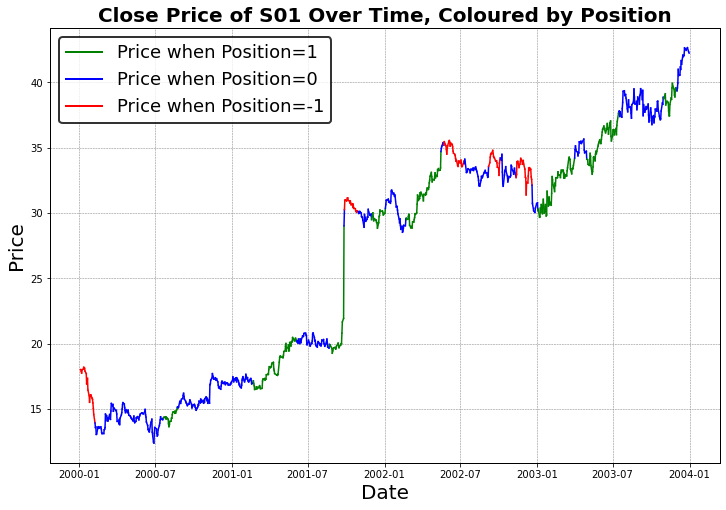

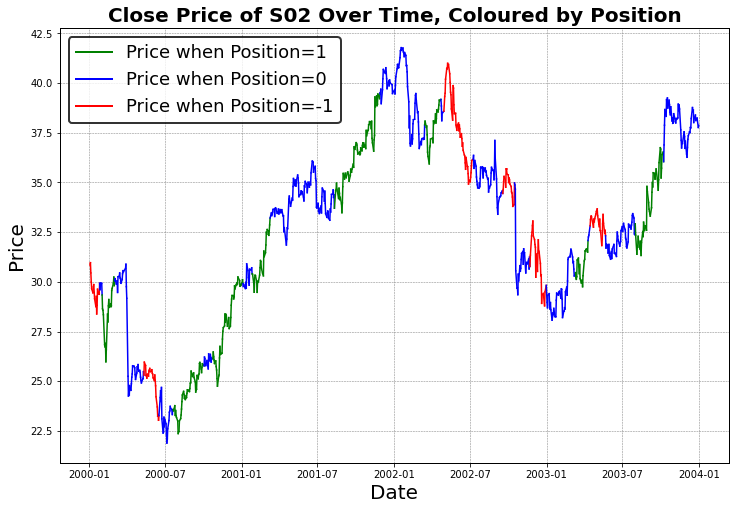

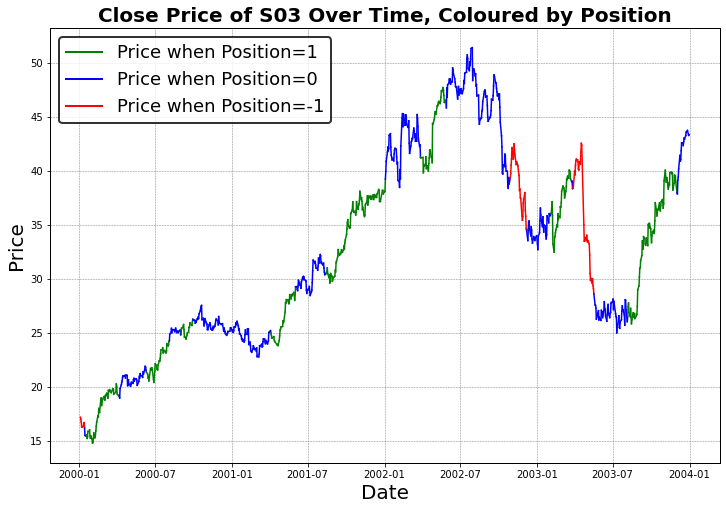

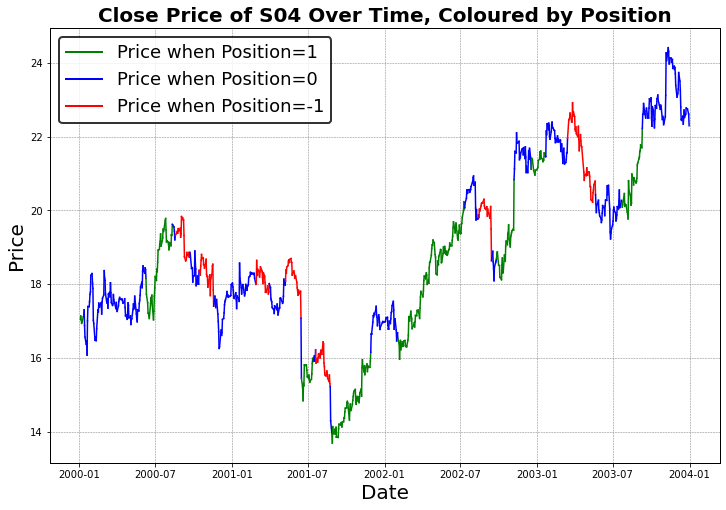

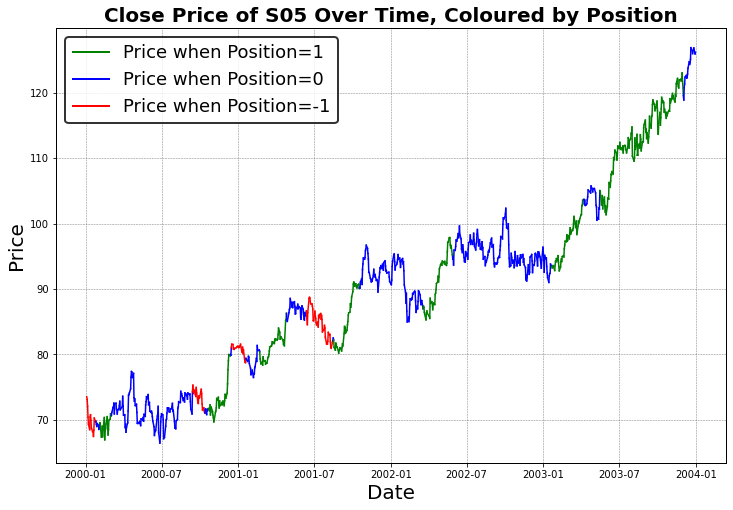

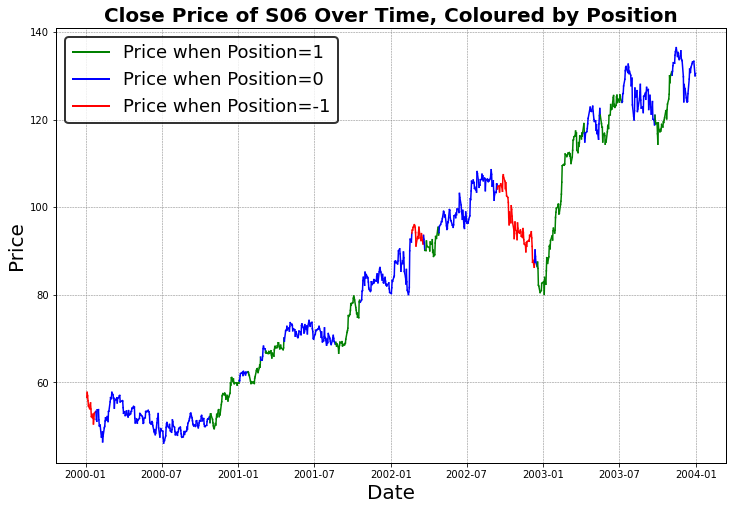

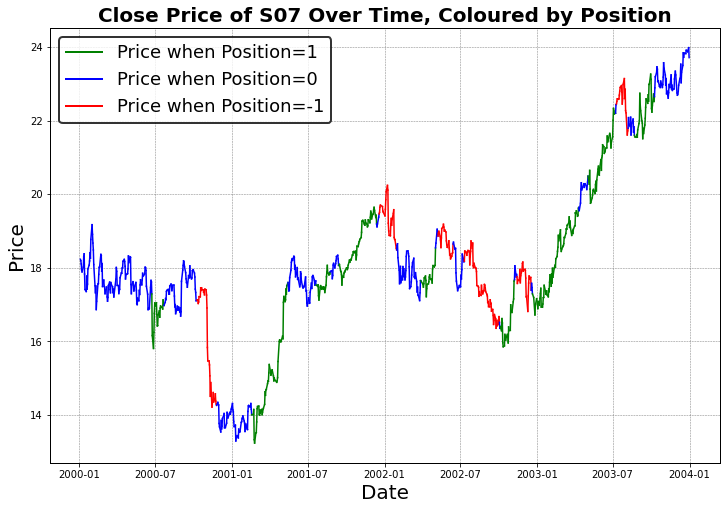

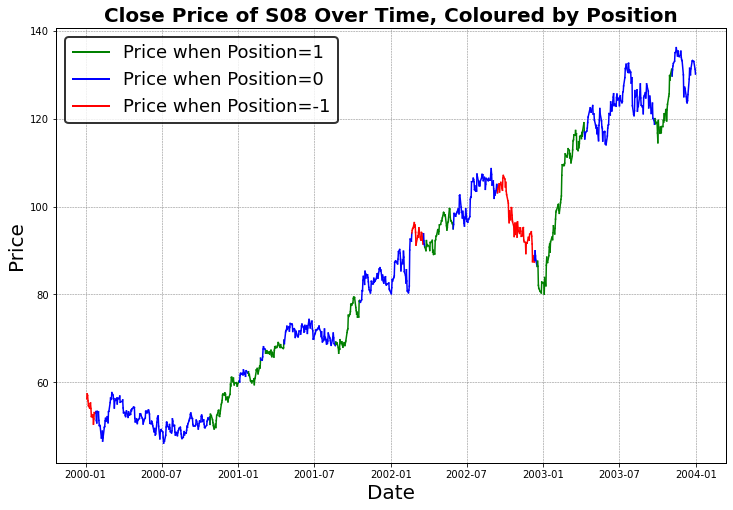

In [35]:
# This cell creates the plots in Figure 2
for i in range(1,9):
    stock_here = f"S0{i}"
    dfplot = market[market["ticker"] == stock_here]

    fig, ax = plt.subplots(figsize=(12, 8))
    fig.patch.set_facecolor("white")
    
    dates_plot = np.array(dfplot["dates"])
    prices_plot = np.array(dfplot["Close"])
    positions_plot = np.array(dfplot["Position"])
    
    color_map = {1: "green", 0: "blue", -1: "red"} # This is the color mapping

    # I iterate through the data and plot segments with different colors
    for i in range(len(dates_plot) - 1):
        plt.plot(dates_plot[i:i+2], prices_plot[i:i+2], color=color_map[positions_plot[i]])

    legend_elements = [
        Line2D([0], [0], color="green", lw=2, label="Price when Position=1"),
        Line2D([0], [0], color="blue", lw=2, label="Price when Position=0"),
        Line2D([0], [0], color="red", lw=2, label="Price when Position=-1")]
    
    legend = plt.legend(handles=legend_elements, loc="upper left", fontsize=18, frameon=True)
    legend.get_frame().set_edgecolor("black")  
    legend.get_frame().set_linewidth(2)  

    plt.xlabel("Date", color="black", fontsize=20)
    plt.ylabel("Price", color="black", fontsize=20)
    plt.title(f"Close Price of {stock_here} Over Time, Coloured by Position", color="black", 
              fontsize=20, weight="bold")          
    plt.grid(color="gray", linestyle="--", linewidth=0.5)

    ax.set_facecolor("white")
    ax.tick_params(axis="x", colors="black")
    ax.tick_params(axis="y", colors="black")

    for spine in ax.spines.values():
        spine.set_edgecolor("black")
        spine.set_linewidth(1)
    
    plt.show()

In [36]:
# The "Position" values are quite unbalanced
round(market["Position"].value_counts(normalize=True) * 100, 2) 

Position
 0    55.65
 1    29.61
-1    14.74
Name: proportion, dtype: float64

# 5) Variable and Model Selection

In [37]:
# As explained in the report, I exclude each ticker's first 29 and last 20 rows for this 
# part of the analysis
filtered_dfs = []
for ticker in all_tickers:
    ticker_data = market[market["ticker"] == ticker]
    filtered_data = ticker_data.iloc[29:-20]  # Exclude first 29 and last 20 rows
    filtered_dfs.append(filtered_data)

df = pd.concat(filtered_dfs, ignore_index=True)
df.set_index("dates", inplace=True)
# Same data in the same order, I just excluded the first 29 and the last 20 rows for each ticker

### 5.1) Correlation Between Predictors

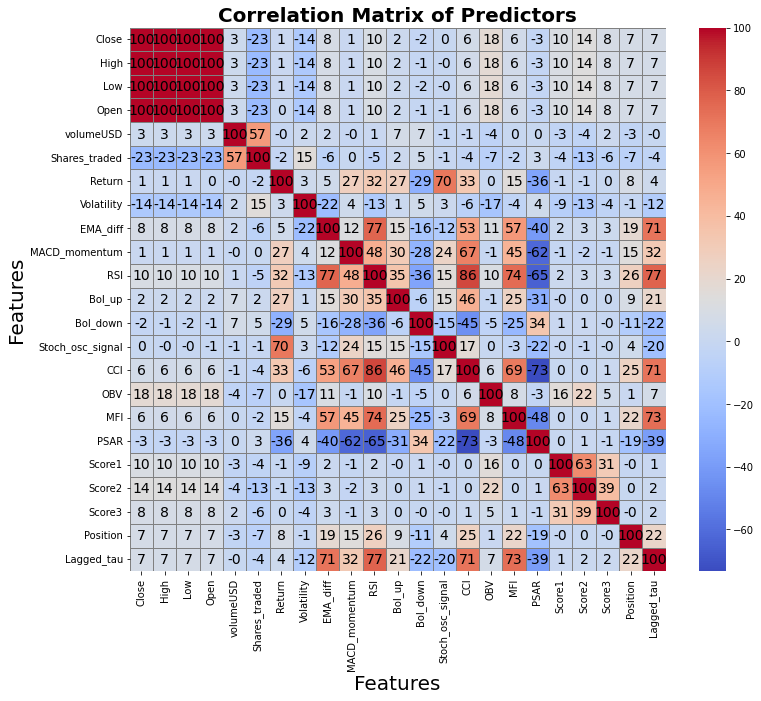

In [38]:
# I compute and plot the correlation matrix, which is shown in Figure 3
corr_matrix = df.drop(["ticker"], axis=1).corr() * 100  

fig = plt.figure(figsize=(12, 10))
fig.patch.set_facecolor("white")

sns.heatmap(corr_matrix, annot=True, fmt='.0f',cmap='coolwarm', cbar=True, 
            annot_kws={"color": "black", "fontsize": 14}, linewidths=0.5, linecolor="gray")

plt.title("Correlation Matrix of Predictors", color="black", fontsize=20, weight="bold")
plt.xlabel("Features", color="black", fontsize=20)
plt.ylabel("Features", color="black", fontsize=20)

ax = plt.gca()
ax.set_facecolor("white")
ax.tick_params(axis="x", colors="black", labelrotation=90, labelsize=10)
ax.tick_params(axis="y", colors="black", labelsize=10)
for spine in ax.spines.values():
    spine.set_edgecolor("black")
    spine.set_linewidth(1)
#plt.savefig("/Users/Giulio/Downloads/plot13.png", dpi=90, bbox_inches="tight", facecolor=fig.get_facecolor())       
plt.show()

In [39]:
# I keep both the open and close price in "df", even if they will not be used to train the  
# machine learning models, because they are needed for the strategy backtests
df.drop(["High", "Low", "volumeUSD"], axis=1, inplace=True)
market.drop(["High", "Low", "volumeUSD"], axis=1, inplace=True)

### 5.2) Mixed-Effects Models for Significance Tests

In [40]:
# Notice that price variables will not be used for prediction
continuous_vars = ["Shares_traded", "Return", "Volatility", "EMA_diff", "RSI", 
"Stoch_osc_signal", "CCI", "OBV", "MFI", "PSAR", "Score1", "Score2", "Score3", "Lagged_tau"]
categorical_vars = ["MACD_momentum", "Bol_up", "Bol_down"]

In [41]:
for var in continuous_vars:
    # This is the model formula
    formula = f"{var} ~ C(Position)"
    
    # I fit a random-intercept model, grouped by ticker
    model = smf.mixedlm(formula, df, groups=df["ticker"])
    result = model.fit(method="powell", maxiter=1000)
    
    print(f"\n***** Variable: {var} *****")
    print(result.summary())


***** Variable: Shares_traded *****
                        Mixed Linear Model Regression Results
Model:                   MixedLM       Dependent Variable:       Shares_traded       
No. Observations:        97300         Method:                   REML                
No. Groups:              100           Scale:                    127176549117524.9219
Min. group size:         973           Log-Likelihood:           -1718378.4319       
Max. group size:         973           Converged:                Yes                 
Mean group size:         973.0                                                       
-------------------------------------------------------------------------------------
                        Coef.          Std.Err.    z   P>|z|    [0.025      0.975]   
-------------------------------------------------------------------------------------
Intercept                7414619.667 1473611.154 5.032 0.000 4526394.879 10302844.456
C(Position)[T.0]          209249.807  107

### 5.3) Visual Exploration of Features by Position

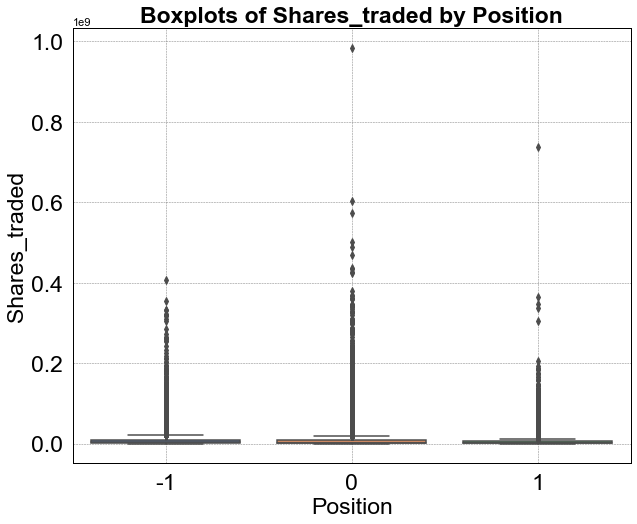

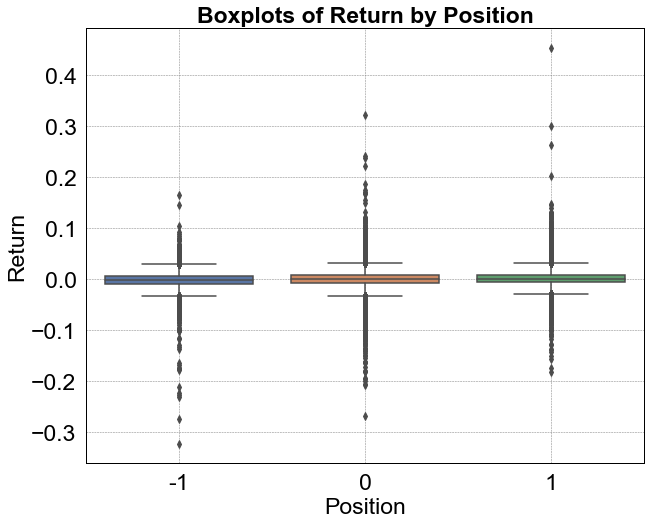

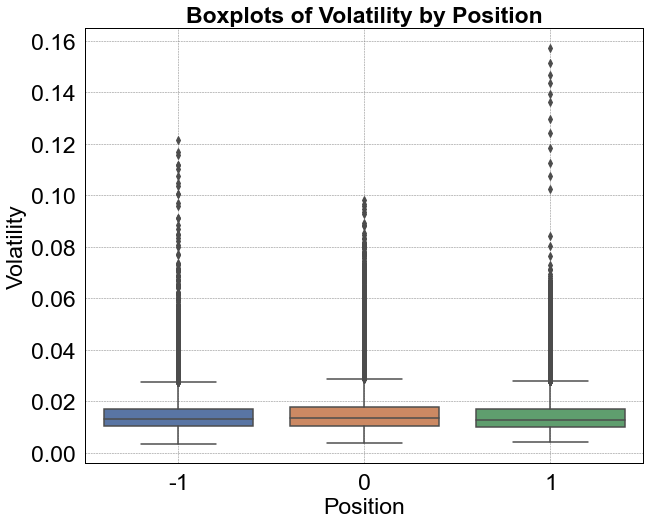

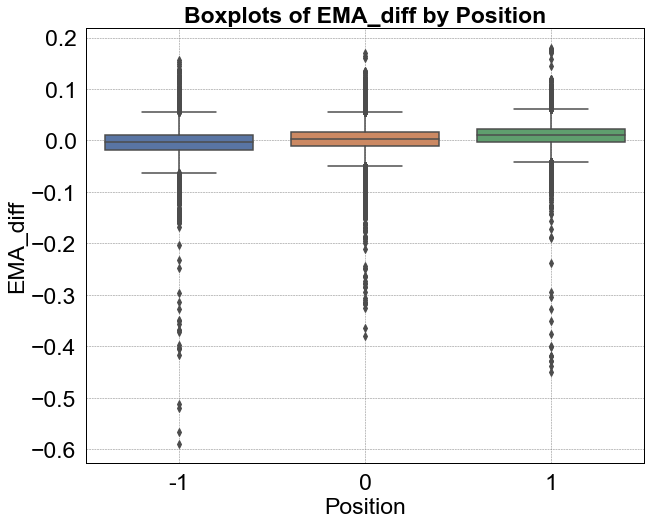

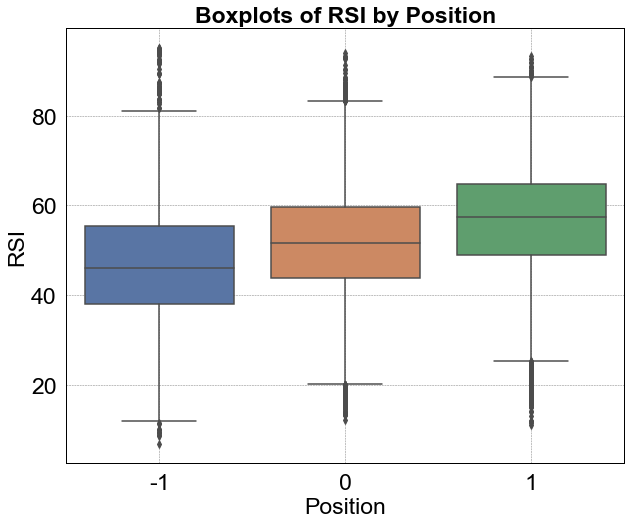

...

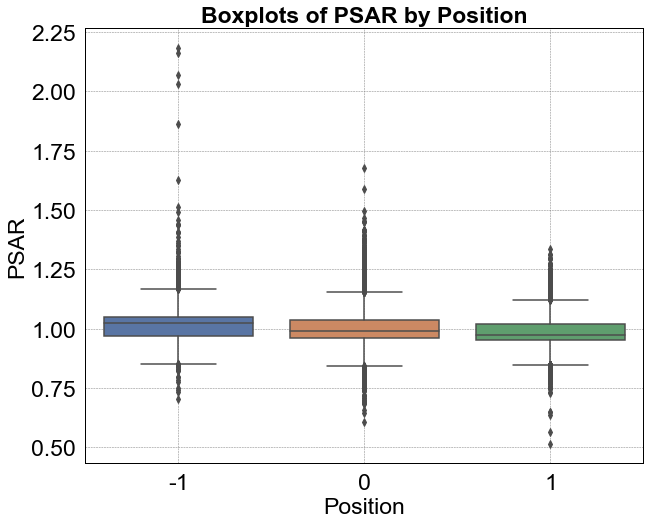

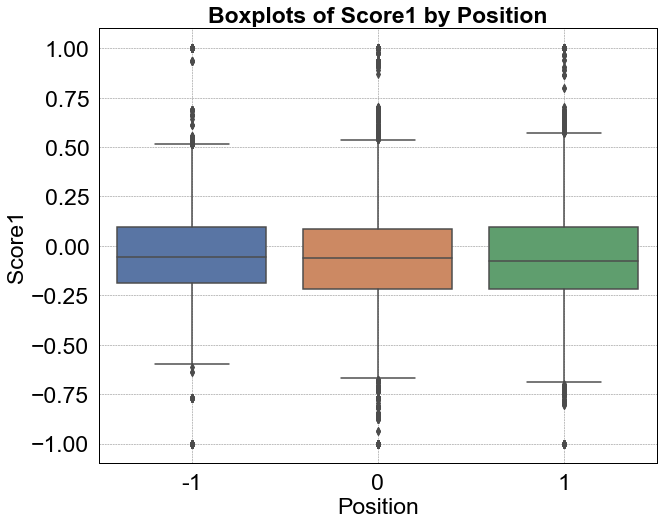

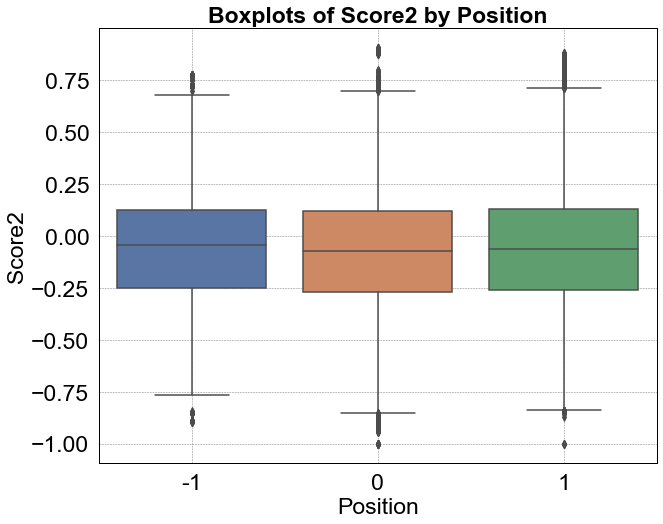

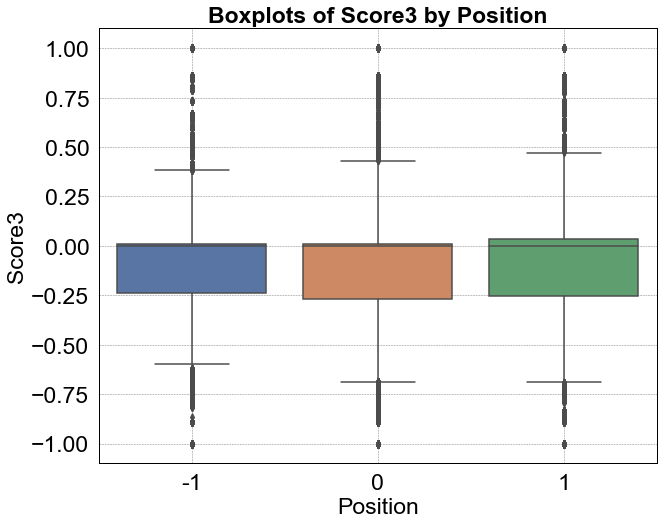

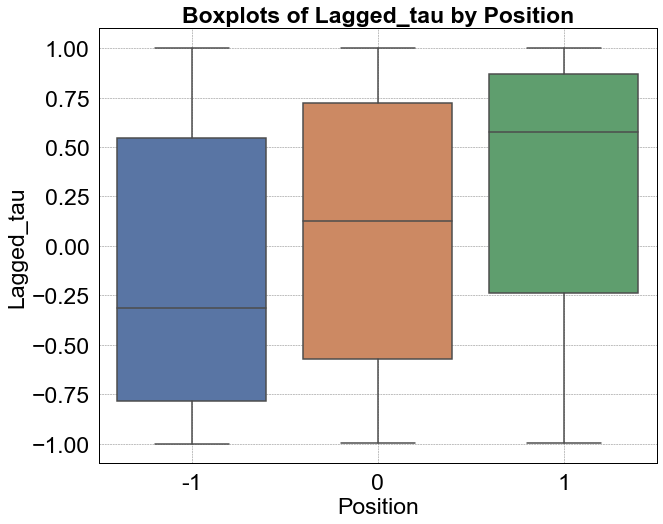

In [42]:
# I plot boxplots for each continuous variable grouped by "Position"
# This cell creates the first 14 plots in Figure 4

sns.set(style="whitegrid")
for var in continuous_vars:
    fig = plt.figure(figsize=(10, 8)) 
    fig.patch.set_facecolor("white") 
    sns.boxplot(x=df["Position"], y=df[var])
    plt.xlabel("Position", color="black", fontsize=23)
    plt.ylabel(f"{var}", color="black", fontsize=23)
    plt.title(f"Boxplots of {var} by Position", color="black", fontsize=23, 
              weight="bold")         
    plt.grid(color="gray", linestyle="--", linewidth=0.5)
    ax = plt.gca() 
    ax.set_facecolor("white") 
    ax.tick_params(axis="x", colors="black", labelsize=23) 
    ax.tick_params(axis="y", colors="black", labelsize=23)  
    for spine in ax.spines.values(): 
        spine.set_edgecolor("black") 
        spine.set_linewidth(1)
    
    plt.show()

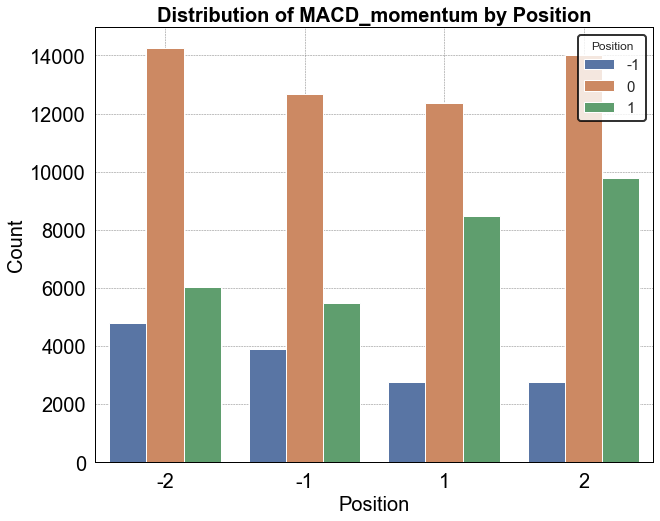

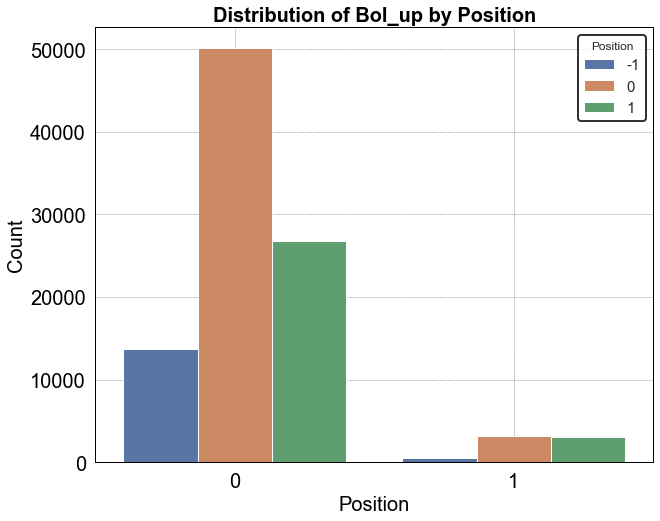

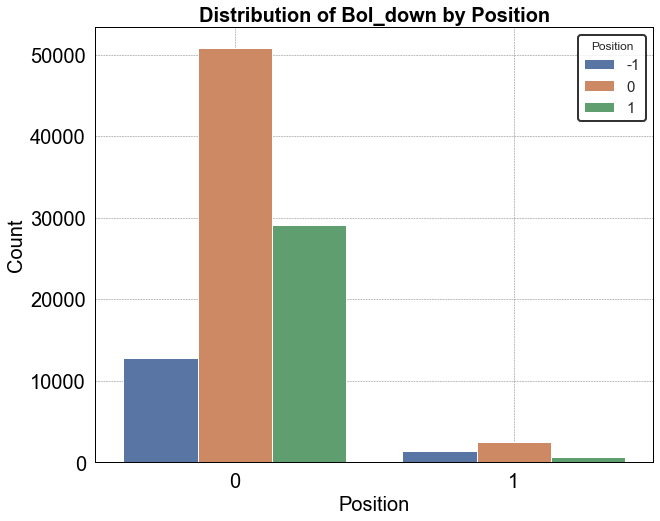

In [43]:
# Now I plot the value counts of each categorical predictor based on the values of "Position"
# This cell creates the last 3 plots in Figure 4

for var in categorical_vars:
    fig = plt.figure(figsize=(10, 8)) 
    fig.patch.set_facecolor("white")

    sns.countplot(data=df, x=var, hue="Position")
    plt.title(f"Distribution of {var} by Position")
    
    plt.xlabel("Position", color="black", fontsize=20)
    plt.ylabel(f"Count", color="black", fontsize=20)
    plt.title(f"Distribution of {var} by Position", color="black", fontsize=20, weight="bold")        
    plt.grid(color="gray", linestyle="--", linewidth=0.5)
    
    ax = plt.gca() 
    ax.set_facecolor("white") 
    ax.tick_params(axis="x", colors="black", labelsize=20) 
    ax.tick_params(axis="y", colors="black", labelsize=20)  
    for spine in ax.spines.values(): 
        spine.set_edgecolor("black") 
        spine.set_linewidth(1)
    
    legend = plt.legend(title="Position", loc="upper right", fontsize=15, frameon=True)
    legend.get_frame().set_edgecolor("black") 
    legend.get_frame().set_linewidth(2)  
    
    plt.show()

### 5.4) Likelihood Ratio Tests with Multinomial Logistic Regression

In [44]:
# I define this integer variable (from 1 to 100) to identify tickers more easily
# This is 1 for ticker "S01", 2 for ticker "S02", and so on, until "S100", for which it is 100
df["ticker_numeric"] = df["ticker"].str.extract(r'(\d+)').astype(int)
market["ticker_numeric"] = market["ticker"].str.extract(r'(\d+)').astype(int)

In [45]:
# "df_first_three_years" contains the first 3 years of data, while "df_stand" contains the 
# remaining year. Both datasets cover all the stocks. The latter will be standardised using 
# the by-ticker means and standard deviations computed on the former, whose only role for now is 
# to provide such statistics. This standardises the data while avoiding look-ahead bias.
# As explained in the report, for now I only standardise 3 predictors ("Shares_traded", "CCI", and "OBV")
cutoff_date = pd.to_datetime("2003-01-01")
df_first_three_years = df.loc[df.index <= cutoff_date].copy()
df_stand = df.loc[df.index > cutoff_date].copy()
vars_to_standardise = ["Shares_traded", "CCI", "OBV"]

In [46]:
# I compute the per-ticker mean and standard deviation of the 3 variables to standardise in the 
# initial 3 years (i.e., in "df_first_three_years"), and I use them to standardise the values
# of the remaining year (i.e., in "df_stand")

for ticker in range(1, 101):
      # "subset" contains the first 3 years of data for the ticker in question
        subset = df_first_three_years[df_first_three_years["ticker_numeric"]==ticker].copy()
        for var in vars_to_standardise:
            mean = np.mean(subset[var])
            std = np.std(subset[var])
            # "mean" and "std" are computed by ticker on the first 3 years of data
            if std > 1e-6:
                df_stand.loc[df_stand["ticker_numeric"] == ticker, var] = (
                df_stand.loc[df_stand["ticker_numeric"] == ticker, var] - mean) / std
            else:
                df_stand.loc[df_stand["ticker_numeric"] == ticker, var] = 0

# The code below "else" is useless in this case, since the 3 variables to standardise are never 
# fixed over 3 years. However, I leave it here for completeness
# Now the data in "df_stand" is identical to the last year of data in "df", except for the
# 3 standardised columns

In [47]:
# I perform a likelihood ratio test for each predictor
lrt_results = []

# First I define the X matrix and y vector
X_logit_lrt = sm.add_constant(df_stand.drop(columns=["Close", "Open", "Position", "ticker", "ticker_numeric"]))       
y_logit_lrt = df_stand["Position"].astype("category")

# Then I fit the full multinomial logistic regression model
full_logit_model = sm.MNLogit(y_logit_lrt, X_logit_lrt).fit(disp=False)

# For each predictor:
for col in X_logit_lrt.columns:
    # I create a reduced model excluding the current predictor
    X_reduced = X_logit_lrt.drop(columns=[col])
    reduced_model = sm.MNLogit(y_logit_lrt, X_reduced).fit(disp=False)
    
    # I run a likelihood ratio test with a chi-squared random variable with 2 degrees of freedom
    lr_stat = 2 * (full_logit_model.llf - reduced_model.llf)
    p_value = chi2.sf(lr_stat, df=2) 
    
    lrt_results.append({"Variable": col, "LR Statistic": lr_stat, "p-value": p_value})

# I now assign the significance codes 
lrt_results_df = pd.DataFrame(lrt_results)
lrt_results_df["Significance"] = lrt_results_df["p-value"].apply(lambda p: '***' if p <= 0.001 else '**'       
                             if p <= 0.01 else '*' if p <= 0.05 else '.' if p <= 0.1 else ' ')

lrt_results_df.sort_values(by="p-value", inplace=True)
print("Significance codes: 0 '***', 0.001 '**', 0.01 '*', 0.05 '.', 0.1 ' '")
print("Likelihood Ratio Test Results:")
lrt_results_df
# This is Table 1

Significance codes: 0 '***', 0.001 '**', 0.01 '*', 0.05 '.', 0.1 ' '
Likelihood Ratio Test Results:


,Variable,LR Statistic,p-value,Significance
14,Score1,56.230871,6.160578e-13,***
3,Volatility,50.959209,8.597027e-12,***
6,RSI,49.559153,1.731278e-11,***
13,PSAR,48.558527,2.855287e-11,***
0,const,42.871215,4.904944e-10,***
4,EMA_diff,36.335082,1.288063e-08,***
15,Score2,34.564239,3.122272e-08,***
11,OBV,33.555546,5.170181e-08,***
8,Bol_down,32.206195,1.015111e-07,***
16,Score3,19.910150,4.748603e-05,***


### 5.5) Variable Ranking with Iterative LASSO (again with Multinomial Logistic Regression)

In [48]:
# Since the LASSO penalty term is applied equally to all predictors, it is essential for all of
# them to be on the same scale. Therefore, I standardise all continuous predictors (again using
# the mean and std of the first 3 years to standardise the last year). This data is put
# in "df_stand_2". The standardisation is again performed by-ticker

df_stand_2 = df.loc[df.index > cutoff_date].copy()

for ticker in range(1, 101):
      # "subset" contains the first 3 years of data for the ticker in question
        subset = df_first_three_years[df_first_three_years["ticker_numeric"]==ticker].copy()
        for var in continuous_vars: # Now I am standardising all continuous variables, whereas before I only standardised 3                
            mean = np.mean(subset[var])
            std = np.std(subset[var])
            # "mean" and "std" are computed by ticker on the first 3 years of data
            if std > 1e-6:
                df_stand_2.loc[df_stand_2["ticker_numeric"] == ticker, var] = (
                df_stand_2.loc[df_stand_2["ticker_numeric"] == ticker, var] - mean) / std
            else:
                df_stand_2.loc[df_stand_2["ticker_numeric"] == ticker, var] = 0

In [49]:
# I again define the X matrix and y vector as before, but this time without the constant and 
# starting from "df_stand_2"
X_logit = df_stand_2.drop(columns=["Close", "Open", "Position", "ticker", "ticker_numeric"]) 
y_logit = df_stand_2["Position"].astype("category")       

# I rebalance the train data, so that each class of "Position" is equally represented
undersampler = RandomUnderSampler(random_state=1)
X_logit_resampled, y_logit_resampled = undersampler.fit_resample(X_logit, y_logit)

# I use log-spaced values for the penalty parameter alpha, which is the inverse of the 
# LASSO penalty term C, so that C = 1 / alpha
penalty_values = np.logspace(3, -5, num=100)  # From 10^3 to 10^-5  

logit_sorted_features = []  # This will store features in order of their "activation"
coefficients_path = pd.DataFrame(index=X_logit.columns, columns=penalty_values)

# I iteratively fit a logistic regression with L1 regularisation
for penalty in penalty_values:
    temporary_model = LogisticRegression(penalty="l1", solver="liblinear", C=1/penalty,
        fit_intercept=True, max_iter=1000)
    
    temporary_model.fit(X_logit_resampled, y_logit_resampled)
     
    # I sum the absolute values of the coefficients across all classes
    # so that a feature is considered active if any of its class-specific coeffs != 0
    coeffs = np.sum(np.abs(temporary_model.coef_), axis=0)
    coefficients_path[penalty] = coeffs
    
     # I identify features that have just become non-zero
    newly_active_features = [
        X_logit.columns[i] 
        for i in np.where(coeffs != 0)[0]
        if X_logit.columns[i] not in logit_sorted_features]
    logit_sorted_features.extend(newly_active_features)
    
print("Feature Importance Order:", logit_sorted_features)

Feature Importance Order: ['MACD_momentum', 'OBV', 'CCI', 'RSI', 'EMA_diff', 'PSAR', 'Volatility', 'Score2', 'MFI', 'Score3', 'Shares_traded', 'Stoch_osc_signal', 'Bol_down', 'Lagged_tau', 'Return', 'Score1', 'Bol_up']


### 5.6) Optimal Number of Predictors in Multinomial Logistic Regression

In [50]:
# I split the available data between a train set (first 3 years) and a test set (last year), 
# which implies roughly a 75-25 train-test split. Both sets contain all the stocks
df_logit_train = df.loc[df.index <= cutoff_date].copy()
df_logit_test  = df.loc[df.index > cutoff_date].copy()

In [51]:
# To increase numerical stability, I standardise the train and test set (again by ticker)
# Again, to avoid look-ahead bias, I use the by-ticker means and standard deviations computed
# on the train set to standardise both the train and test sets

for ticker in range(1, 101):
     # "subset" contains the first 3 years of data for the ticker in question
        subset = df_logit_train[df_logit_train["ticker_numeric"]==ticker].copy()
        for var in continuous_vars:
            # "mean" and "std" are computed by ticker on the first 3 years of data
            mean = np.mean(subset[var])
            std = np.std(subset[var])
            
            if std > 1e-6:
                df_logit_train.loc[df_logit_train["ticker_numeric"] == ticker, var] = (
                df_logit_train.loc[df_logit_train["ticker_numeric"] == ticker, var] - mean) / std
        
                df_logit_test.loc[df_logit_test["ticker_numeric"] == ticker, var] = (
                df_logit_test.loc[df_logit_test["ticker_numeric"] == ticker, var] - mean) / std
            
            else:
                df_logit_train.loc[df_logit_train["ticker_numeric"] == ticker, var] = 0
                df_logit_test.loc[df_logit_test["ticker_numeric"] == ticker, var] = 0

In [52]:
# I define X and y for train and test
X_logit_train = sm.add_constant(df_logit_train.drop(columns=["Close", "Open", "Position", "ticker", "ticker_numeric"]))         
y_logit_train = df_logit_train["Position"]
X_logit_test = sm.add_constant(df_logit_test.drop(columns=["Close", "Open", "Position", "ticker", "ticker_numeric"]))
y_logit_test = df_logit_test["Position"]

# Again, I rebalance the train data
undersampler = RandomUnderSampler(random_state=1)
X_logit_train_resampled, y_logit_train_resampled = undersampler.fit_resample(
                                                   X_logit_train, y_logit_train)

performance_logit = {}

# I fit a model for each of the top i variables, and compute its out-of-sample accuracy
for i in range(1, len(logit_sorted_features) + 1):
    selected_variables = logit_sorted_features[:i]
    X_logit_train_subset = X_logit_train_resampled[selected_variables]
    X_logit_test_subset = X_logit_test[selected_variables]
    
    temporary_model = LogisticRegression(max_iter=1000, random_state=1)
    temporary_model.fit(X_logit_train_subset, y_logit_train_resampled)
    temporary_y_pred = temporary_model.predict(X_logit_test_subset)
    performance_logit[i] = accuracy_score(y_logit_test, temporary_y_pred)

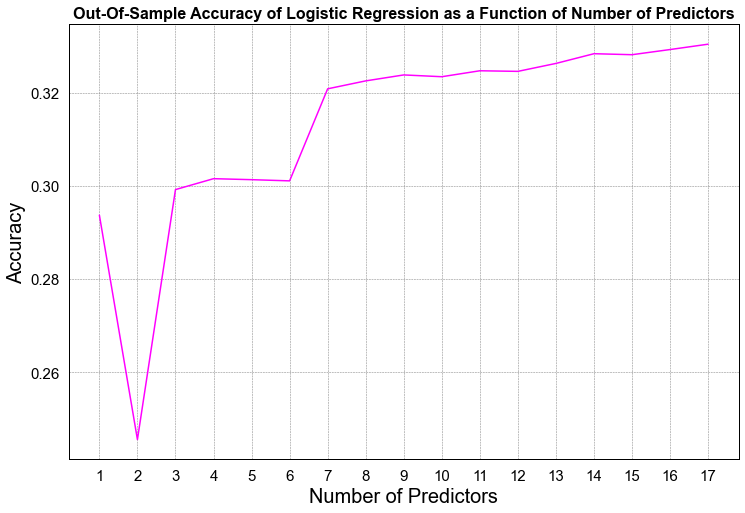

In [53]:
# This cell creates Figure 5

fig = plt.figure(figsize=(12, 8)) 
fig.patch.set_facecolor("white") 

plt.plot(list(performance_logit.keys()), list(performance_logit.values()), color="magenta")       
plt.xlabel("Number of Predictors", color="black", fontsize=20)
plt.ylabel("Accuracy", color="black", fontsize=20)
plt.title(f"Out-Of-Sample Accuracy of Logistic Regression as a Function of Number of Predictors",
          color="black", fontsize=16, weight="bold")                        
plt.grid(color="gray", linestyle="--", linewidth=0.5)
ax = plt.gca() 
ax.set_facecolor("white") 
ax.tick_params(axis="x", colors="black", labelsize=15) 
ax.tick_params(axis="y", colors="black", labelsize=15)  
ax.set_xticks(range(1, len(logit_sorted_features)+1))
for spine in ax.spines.values(): 
    spine.set_edgecolor("black") 
    spine.set_linewidth(1)   
plt.savefig("/Users/Giulio/Downloads/plotxx.png", dpi=150, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()

### 5.7) Similar Analysis with Random Forest

In [54]:
# I define the X matrix and y vector for the random forest, using non-standardised data
X_rf = df.drop(columns=["Close", "Open", "Position", "ticker", "ticker_numeric"])
y_rf = df["Position"]

# I fit the model
rf = RandomForestClassifier(n_estimators=100, random_state=1)
rf.fit(X_rf, y_rf)

# This computes feature importance based on the reduction in Gini impurity
rf_importance_df = pd.DataFrame({"Feature": X_rf.columns, "Importance": rf.feature_importances_})
rf_importance_df.sort_values(by="Importance", ascending=False, inplace=True)
rf_importance_df
# This is Table 2

,Feature,Importance
14,Score2,0.098365
13,Score1,0.094841
10,OBV,0.074778
0,Shares_traded,0.074238
2,Volatility,0.074157
3,EMA_diff,0.073856
16,Lagged_tau,0.069735
5,RSI,0.068883
15,Score3,0.067028
11,MFI,0.064742


In [55]:
rf_sorted_features = list(rf_importance_df["Feature"])

In [56]:
# Warning: running this cell takes quite a lot of time, since many random forests are trained

# As I did for the logistic regression model, I train a random forest on the top "i" features 
# and record its out-of-sample accuracy
# The train-test split is again the approximate 75-25 split used for the logistic regression,
# so the train set contains the first 3 years of data, and the test set contains the last year
# Both sets contain all 100 stocks
cutoff_date = pd.to_datetime("2003-01-01")
df_rf_train = df.loc[df.index <= cutoff_date].copy()
df_rf_test  = df.loc[df.index > cutoff_date].copy()

X_rf_train = df_rf_train.drop(columns=["Close", "Open", "Position", "ticker", "ticker_numeric"])          
y_rf_train = df_rf_train["Position"]
X_rf_test = df_rf_test.drop(columns=["Close", "Open", "Position", "ticker", "ticker_numeric"])          
y_rf_test = df_rf_test["Position"]

performance_rf = {}

for i in range(1, len(rf_sorted_features) + 1):
    selected_variables = rf_sorted_features[:i]
    X_rf_train_subset = X_rf_train[selected_variables]
    X_rf_test_subset = X_rf_test[selected_variables]
    
    temporary_model = RandomForestClassifier(n_estimators=100, random_state=1)
    temporary_model.fit(X_rf_train_subset, y_rf_train)
    temporary_y_pred = temporary_model.predict(X_rf_test_subset)
    performance_rf[i] = accuracy_score(y_rf_test, temporary_y_pred)

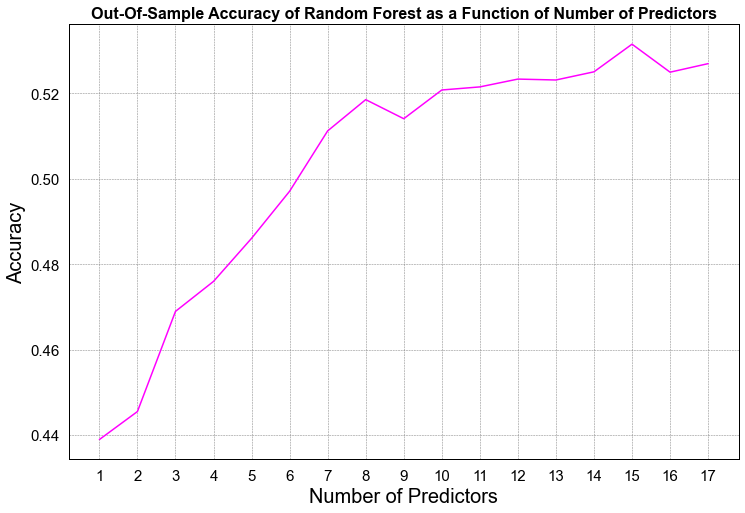

In [57]:
# This cell creates Figure 6
fig = plt.figure(figsize=(12, 8)) 
fig.patch.set_facecolor("white") 

plt.plot(list(performance_rf.keys()), list(performance_rf.values()), color="magenta")       
plt.xlabel("Number of Predictors", color="black", fontsize=20)
plt.ylabel("Accuracy", color="black", fontsize=20)
plt.title(f"Out-Of-Sample Accuracy of Random Forest as a Function of Number of Predictors", 
          color="black", fontsize=16, weight="bold")                         
plt.grid(color="gray", linestyle="--", linewidth=0.5)
ax = plt.gca() 
ax.set_facecolor("white") 
ax.tick_params(axis="x", colors="black", labelsize=15) 
ax.tick_params(axis="y", colors="black", labelsize=15)  
ax.set_xticks(range(1, len(rf_sorted_features)+1))
for spine in ax.spines.values(): 
    spine.set_edgecolor("black") 
    spine.set_linewidth(1)

plt.show()

In [58]:
# I decide to use the 10 most relevant features
rf_features = rf_sorted_features[:10]

# 6) Creating the End-Of-Day Positions

In [59]:
# This column will be used to update the "market" dataset with the correct EOD positions
market["Row_identifier"] = list(market.index)

# I choose a batch size of 40, meaning that I re-train the model every 40 trading days, using past data            
batch = 40

# This list will contain the EOD positions, which I will merge at the end
all_predictions = []

# These are the unique dates (already sorted chronologically), without the first 29 days
unique_dates = market["dates"].unique()[29:]
all(unique_dates[i] <= unique_dates[i+1] for i in range(len(unique_dates) - 1))

True

In [60]:
# Warning: running this cell takes quite a lot of time, since many random forests are trained

# For the first 29 days and the days in the first batch (i.e., for the first 29+40=69 days) 
# I set the EOD positions to 0
first_dates = market["dates"].unique()[:69]
first_dates_mask = market["dates"].isin(first_dates)
market.loc[first_dates_mask, "EOD_position"] = 0.0

# Now I iterate in day‐blocks of length = batch (so each block contains 40 consecutive days)
# For each block "i", I train the random forest on all previous days (excluding the first 29, 
# as already done in Section 5), and I use this model to create the EOD positions for that block
num_blocks = int(np.ceil(len(unique_dates) / batch))

for block_index in range(1, num_blocks):
    # The last day I include in the train set is (block_index * batch - 1)
    train_end_idx = block_index * batch
    # The test block (i.e., the block for which to make predictions) is composed of the 
    # 40 days after the last day in the train set (unless it runs beyond the total days)        
    test_end_idx = min((block_index+1) * batch, len(unique_dates))
    
    # Every train-test split only uses dates from the 30^th trading day onwards (as done in Section 5)      
    train_dates = unique_dates[:train_end_idx]    
    test_dates = unique_dates[train_end_idx : test_end_idx]
    
    #print(f"Train period: [{train_dates[0]}, {train_dates[-1]}] ({len(train_dates)} days)")
    #print(f"Test period: [{test_dates[0]}, {test_dates[-1]}] ({len(test_dates)} days)\n")
    
    # The test set contains the days for which to create the EOD positions      
    train_data = market[market["dates"].isin(train_dates)]
    test_data = market[market["dates"].isin(test_dates)].copy()
    
    # Now I train the random forest on "rf_features" to predict "Position"
    rf_temporary = RandomForestClassifier(n_estimators=100, random_state=1) 
    rf_temporary.fit(train_data[rf_features], train_data["Position"])
    
    # This contains the predicted probabilities for the next batch of days
    probs = rf_temporary.predict_proba(test_data[rf_features])
    # p_{-1} is probs[:, 0], p_{0} is probs[:, 1], p_{1} is probs[:, 2]
    eod_positions = probs[:, 2] - probs[:, 0]  # This is p_{1} - p_{-1}, the expected value of "Position", in [-1, 1]      
    
    # I insert the EOD positions into the "test_data" subset, and store these predictions
    test_data["EOD_position"] = eod_positions
    all_predictions.append(test_data)

# After all EOD positions are predicted, I combine all per-batch predictions
predictions_df = pd.concat(all_predictions)

# and merge them back into "market" (which already has EOD_position = 0 for the first 69 days)
market = market.merge(predictions_df[["Row_identifier", "EOD_position"]], 
                      on="Row_identifier", 
                      how="left", suffixes=("", "_pred"))

# Wherever I have a prediction, I use it; otherwise I keep the old EOD position
mask = market["EOD_position_pred"].notna()
market.loc[mask, "EOD_position"] = market.loc[mask, "EOD_position_pred"]     

# I drop the temporary column
market.drop(columns="EOD_position_pred", inplace=True) 

In [61]:
# I save the dataset as "market_eod_pos"
market[["dates", "ticker", "Close", "Open", "EOD_position"]].to_csv("/Users/Giulio/Library/Mobile Documents/com~apple~CloudDocs/Work/Quant/Point72 take-home project/market_eod_pos.csv", index=False)        

# 7) Backtesting a Trading Strategy

In [62]:
# This function backtests my trading strategy on the portion of market-price dataset corresponding
# to a single ticker. It works both with a discrete signal (as "Position") and with a continuous 
# signal (as "EOD_position"). In the case of a discrete signal in {-1,0,1}, the "threshold" 
# variable is irrelevant, as long as it is in (0,1)
def backtest_single_ticker(df, target="EOD_position", threshold=0.5, initial_capital=10000,
    capital_fraction=1, transaction_cost=0.001):
    
    df_copy = df.copy()
    
    # First I shift the original signal by 1 day
    df_copy["Signal"] = df_copy[target].shift(1).fillna(0)
    
    # Then I convert the signal to categorical -1, 0, 1 based on "threshold"
    df_copy["Signal"] = np.where(df_copy["Signal"] > threshold, 1,
                        np.where(df_copy["Signal"] < -threshold, -1, 0))
    
    cash = initial_capital
    shares_held = 0
    results = []
    
    # This is the main loop over each day
    for i, row in df_copy.iterrows():
        current_date = row["dates"]
        open_price = row["Open"]
        close_price = row["Close"]
        current_signal = row["Signal"]  # This is -1, 0, or 1 from yesterday

        # Every day, I first check if I should close my position on this ticker 
        if (shares_held > 0 and current_signal <= 0) or (shares_held < 0 and current_signal >= 0):             
            trade_value = shares_held * open_price
            cash += trade_value
            cost = abs(trade_value) * transaction_cost
            cash -= cost
            shares_held = 0
        
        # Then I check if I should open any position on this ticker 
        if shares_held == 0 and current_signal != 0:
            capital_to_use = cash * capital_fraction
            num_shares = int(np.floor(capital_to_use / open_price))
            
            if num_shares > 0:
                trade_value = num_shares * open_price
                cost = trade_value * transaction_cost
                
                if current_signal == 1:
                    # Go long
                    cash -= trade_value
                    cash -= cost
                    shares_held = num_shares
                else:
                    # Go short
                    cash += trade_value
                    cash -= cost
                    shares_held = -num_shares
        
        # At the end of the trading day, I update my capital by marking it to market 
        # (i.e., by using the close price)        
        equity = cash + shares_held * close_price
        
        # I store the result in a dictionary, that I then transform into a dataframe, and return       
        results.append({"dates": current_date, "equity": equity})
        
    # This is essentially the equity curve (how the capital invested on this ticker evolves over time)      
    return pd.DataFrame(results)

In [63]:
# This function simply applies the previous one to a dataset with more than one ticker, and it 
# invests the same amount of money on each of these stocks
def backtest_all_tickers(df, target="EOD_position", threshold=0.5, initial_capital_per_stock=10000,
    capital_fraction=1, transaction_cost=0.001):
    
    results_per_ticker = []
    
    copy = df.copy()
    # I group the dataset by ticker
    grouped = copy.groupby("ticker", group_keys=False)
    
    # Then I apply the "backtest_single_ticker" function separately to each single-ticker dataset
    for ticker, df_sub in grouped:
        single_res = backtest_single_ticker(df_sub, target=target, threshold=threshold,
            initial_capital=initial_capital_per_stock, capital_fraction=capital_fraction,
            transaction_cost=transaction_cost)
        single_res["ticker"] = ticker
        results_per_ticker.append(single_res)
        
    all_tickers_df = pd.concat(results_per_ticker, ignore_index=True)
    
    # I compute the total daily equity of the portfolio as the sum of the daily equities 
    # allocated to each ticker. In other words, the total value of my portfolio at any time 
    # is just the sum of the values of the investments in the single tickers (trivially)
    daily_equity = (all_tickers_df.groupby("dates")["equity"].sum().rename("total_equity")
        .reset_index().sort_values("dates"))
    
    # I also need the daily returns
    daily_equity["returns"] = daily_equity["total_equity"].pct_change().fillna(0)
    
    # This returns a dataset with columns "dates", "total_equity" (which shows how the capital
    # evolves over time), and "returns" (which contains the daily PnL of the whole portfolio)
    return daily_equity

In [64]:
# Now I backtest my strategy on the target variable itself (i.e., these are the results of a 
# predictive model with 100% accuracy). These results are not meant to prove the validity of my 
# predictive models, but just of the way I have created the target variable "Position"
overall_results_on_target = backtest_all_tickers(
    market,
    target="Position",
    threshold=0.5,
    initial_capital_per_stock=10000,
    capital_fraction=1,
    transaction_cost=0.001)

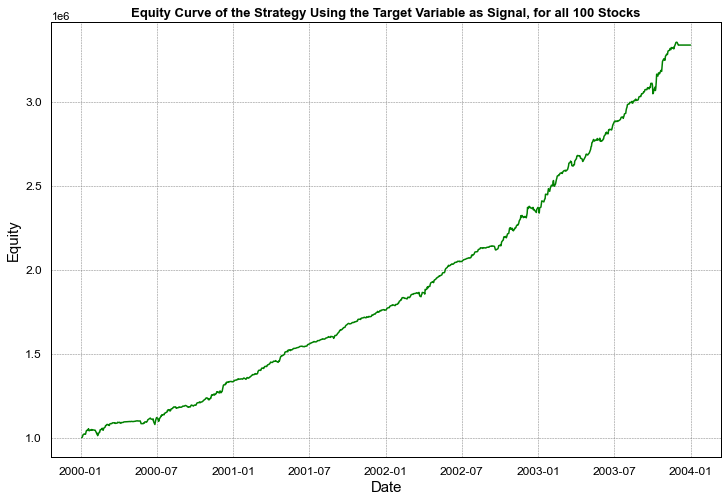

In [65]:
# This plots the results of the backtest on the target variable itself
# This cell creates Figure 7

fig = plt.figure(figsize=(12, 8)) 
fig.patch.set_facecolor("white") 
plt.plot(np.array(pd.to_datetime(overall_results_on_target["dates"])), 
         np.array(overall_results_on_target["total_equity"]), color="green")               
plt.xlabel("Date", color="black", fontsize=15)
plt.ylabel("Equity", color="black", fontsize=15)
plt.title("Equity Curve of the Strategy Using the Target Variable as Signal, for all 100 Stocks",
          color="black", weight="bold", fontsize=13)
plt.grid(color="gray", linestyle="--", linewidth=0.5)
ax = plt.gca() 
ax.set_facecolor("white") 
ax.tick_params(axis="x", colors="black", labelsize=12) 
ax.tick_params(axis="y", colors="black", labelsize=12)  
for spine in ax.spines.values(): 
    spine.set_edgecolor("black") 
    spine.set_linewidth(1)

plt.show()

In [66]:
total_pnl1 = overall_results_on_target["total_equity"].iloc[-1] / overall_results_on_target["total_equity"].iloc[0] - 1                
annualised_pnl1 = (1+total_pnl1)**0.25 - 1
annualised_volatility1 = overall_results_on_target["returns"].std() * 252**0.5
sharpe_ratio1 = (annualised_pnl1 - 0.03) / annualised_volatility1
print(f"""Strategy results when backtested on the target variable itself:
Total PnL: {round(total_pnl1*100, 2)}%
Annualised PnL: {round(annualised_pnl1*100, 2)}%
Annualised volatility: {round(annualised_volatility1*100, 2)}%
Sharpe ratio: {round(sharpe_ratio1, 2)}""")

Strategy results when backtested on the target variable itself:
Total PnL: 233.98%
Annualised PnL: 35.19%
Annualised volatility: 5.3%
Sharpe ratio: 6.07


In [67]:
# I will backtest my trading strategy using the EOD positions predicted above, and I will obtain
# results for every threshold value
threshold_values = np.array(list(np.round(np.arange(0.02, 0.2, 0.02), 7)) + 
                            list(np.round(np.arange(0.2, 0.5, 0.05), 7)) +
                            list(np.round(np.arange(0.5, 1, 0.1), 7)))
threshold_values

array([0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16, 0.18, 0.2 , 0.25,
       0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.6 , 0.7 , 0.8 , 0.9 ])

In [68]:
# The keys of this dictionary are the different threshold values (from 0.02 to 0.9), and the 
# corresponding dictionary values are the datasets containing the backtest results for each 
# different threshold value
overall_results_on_predictions = {x:np.nan for x in threshold_values}

In [69]:
for current_threshold in threshold_values:
    # Now I backtest my strategy with the EOD positions (i.e., using the model's predictions), 
    # with each different threshold value
    overall_results_on_predictions[current_threshold] = backtest_all_tickers(
    market,
    target = "EOD_position",
    threshold=current_threshold,
    initial_capital_per_stock=10000,
    capital_fraction=1,
    transaction_cost=0.001)

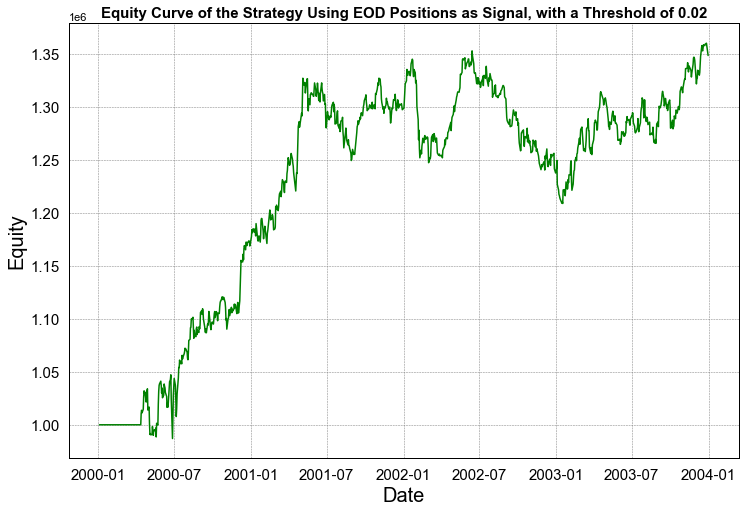

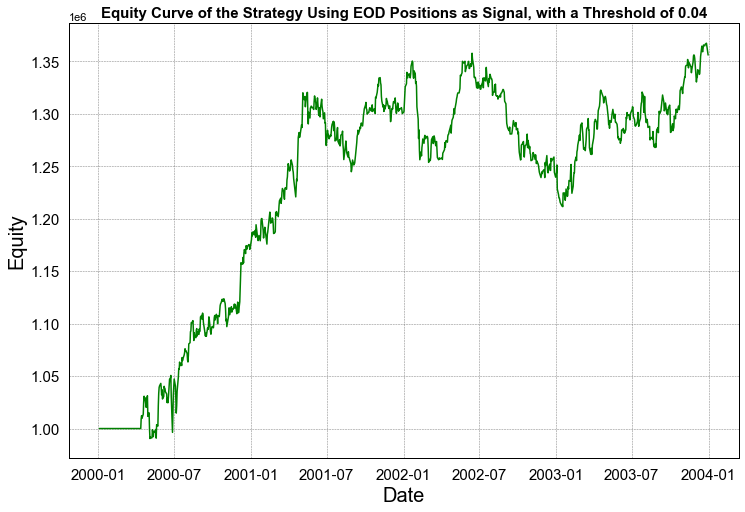

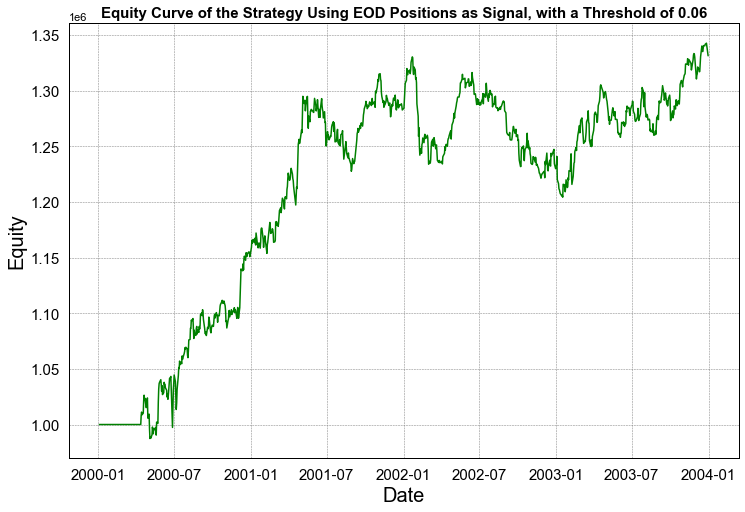

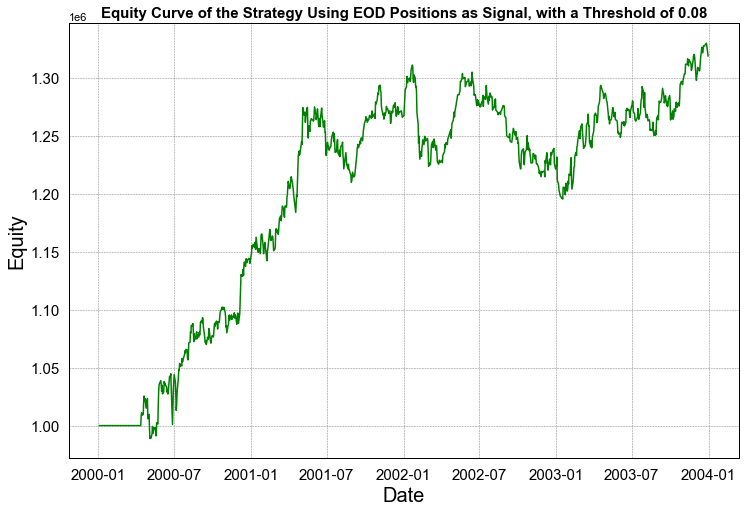

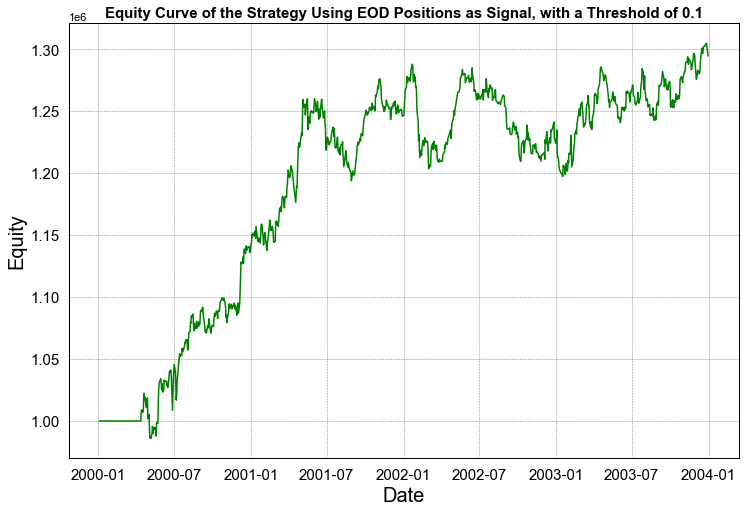

...

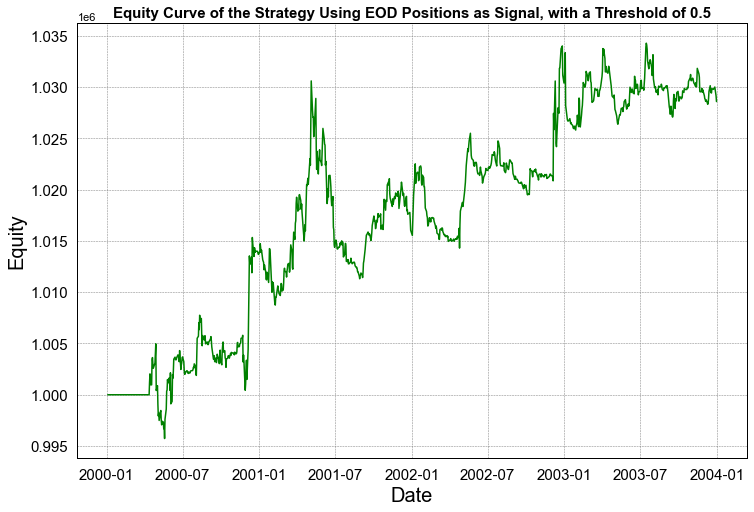

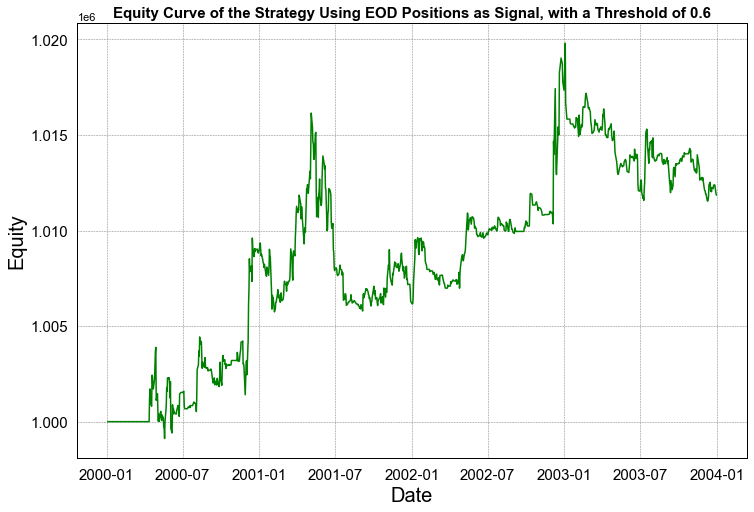

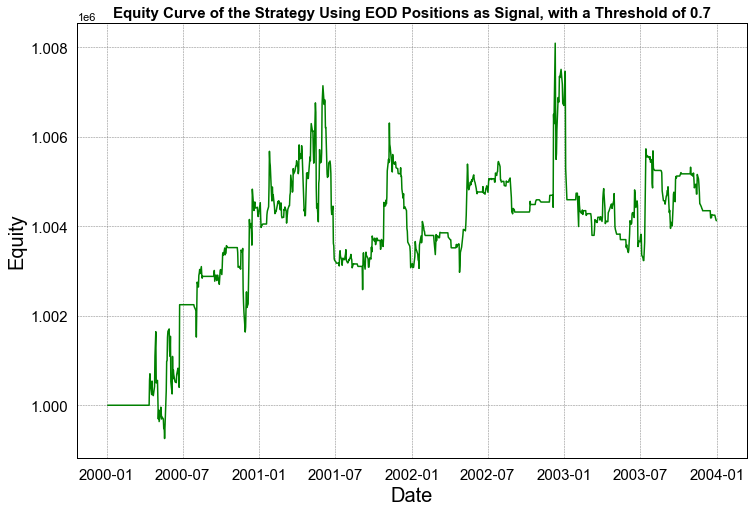

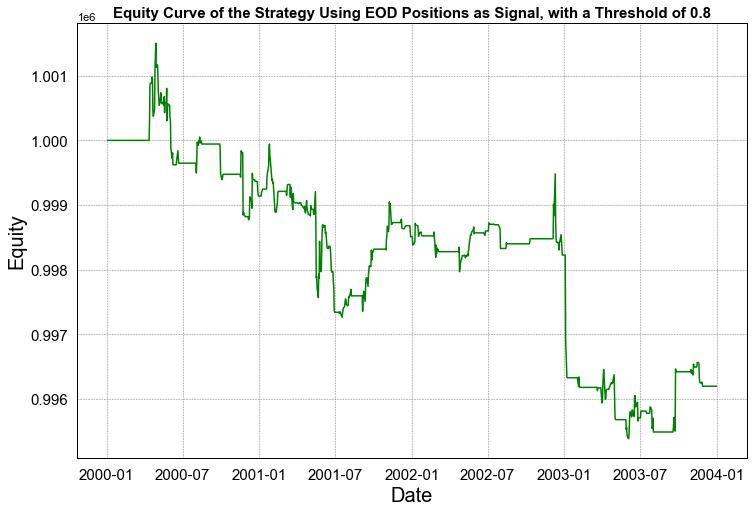

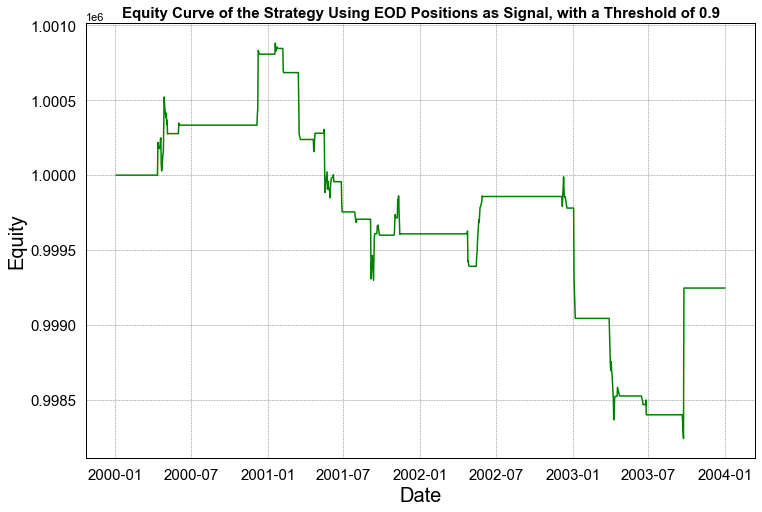

In [70]:
# This creates, for different values of "current_threshold", each of the plots in Figure 8

for current_threshold in threshold_values:
    fig = plt.figure(figsize=(12, 8)) 
    fig.patch.set_facecolor("white") 
    plt.plot(np.array(pd.to_datetime(overall_results_on_predictions[current_threshold]["dates"])), 
      np.array(overall_results_on_predictions[current_threshold]["total_equity"]), color="green")                 
    plt.xlabel("Date", color="black", fontsize=20)
    plt.ylabel("Equity", color="black", fontsize=20)
    plt.title(f"Equity Curve of the Strategy Using EOD Positions as Signal, with a Threshold of {round(current_threshold, 5)}",         
          color="black", weight="bold", fontsize=15)
    plt.grid(color="gray", linestyle="--", linewidth=0.5)
    ax = plt.gca() 
    ax.set_facecolor("white") 
    ax.tick_params(axis="x", colors="black", labelsize=15) 
    ax.tick_params(axis="y", colors="black", labelsize=15)  
    for spine in ax.spines.values(): 
        spine.set_edgecolor("black") 
        spine.set_linewidth(1)
    
    plt.show()

In [71]:
# This is the data in Table 3

threshold_col, total_pnl_col, annualised_pnl_col, annualised_volatility_col, sharpe_ratio_col = [], [], [], [], []   

for current_threshold in threshold_values:
    current_data = overall_results_on_predictions[current_threshold]
    total_pnl_now = current_data["total_equity"].iloc[-1] / current_data["total_equity"].iloc[0] - 1                
    annualised_pnl_now = (1+total_pnl_now) ** 0.25 - 1
    annualised_volatility_now = current_data["returns"].std() * 252**0.5
    sharpe_ratio_now = (annualised_pnl_now - 0.03) / annualised_volatility_now
    
    threshold_col.append(current_threshold)
    total_pnl_col.append(f"{round(total_pnl_now*100, 2)}%")
    annualised_pnl_col.append(f"{round(annualised_pnl_now*100, 2)}%") 
    annualised_volatility_col.append(f"{round(annualised_volatility_now*100, 2)}%")
    sharpe_ratio_col.append(round(sharpe_ratio_now, 2))

data = {'Threshold': threshold_col, 'Total_pnl': total_pnl_col, 'Annualised_pnl': annualised_pnl_col, 
        'Annualised_volatility': annualised_volatility_col, 'Sharpe_ratio': sharpe_ratio_col}

pd.DataFrame(data)

,Threshold,Total_pnl,Annualised_pnl,Annualised_volatility,Sharpe_ratio
0,0.02,34.85%,7.76%,8.3%,0.57
1,0.04,35.61%,7.91%,8.06%,0.61
2,0.06,33.13%,7.42%,7.56%,0.58
3,0.08,31.87%,7.16%,7.19%,0.58
4,0.10,29.46%,6.67%,6.74%,0.54
5,0.12,29.91%,6.76%,6.49%,0.58
6,0.14,28.53%,6.48%,6.02%,0.58
7,0.16,25.63%,5.87%,5.59%,0.51
8,0.18,23.13%,5.34%,5.23%,0.45
9,0.20,19.87%,4.64%,4.89%,0.33


In [72]:
# Based on these results, I choose 0.04 as the optimal threshold value to use
best_threshold = 0.04

# 8) Constructing a Dynamic Portfolio

### 8.2) Identifying Groups of Correlated Stocks

In [73]:
# This dataset has "dates" as indexes, and the close prices of each stock as columns. So it has 
# 100 columns and 1022 rows
market_by_ticker = market.pivot(index="dates", columns="ticker", values="Close")
market_by_ticker.columns = [str(col) for col in market_by_ticker.columns]
sorted_columns = sorted(market_by_ticker.columns, key=lambda x: int(x[1:]))
market_by_ticker = market_by_ticker[sorted_columns]
market_by_ticker.index = pd.to_datetime(market_by_ticker.index)

In [74]:
def create_clusters(df, window, min_corr):
    """
    This function divides the input dataset into segments of consecutive "window" days and 
    performs clustering on each complete segment. For each segment, stocks are grouped into 
    clusters such that every stock in a cluster has a correlation of at least min_corr with all 
    the other stocks in the same cluster. The clustering process uses an initial greedy assignment 
    followed by iterative refinement.
    """
    
    clusters_by_segment = {}
    n = len(df)
    num_full_segments = n // window  # I only process complete segments
    all_stocks = list(df.columns)
    
    for seg in range(num_full_segments):
        # Each segment is made of consecutive rows corresponding to "window" days
        segment = df.iloc[seg * window : (seg + 1) * window]
        
        # This is the correlation matrix for this segment
        ticker_corr_matrix = segment.corr()
        assigned = set()
        clusters = []
        
        # First I perform the initial greedy clustering
        for i in range(len(all_stocks)):
            stock_i = all_stocks[i]
            if stock_i not in assigned:
                new_cluster = [stock_i]
                assigned.add(stock_i)
                for j in range(i + 1, len(all_stocks)):
                    stock_j = all_stocks[j]
                    if stock_j not in assigned:
                        if all(ticker_corr_matrix.loc[stock_j, member] >= min_corr for member in new_cluster):
                            new_cluster.append(stock_j)
                            assigned.add(stock_j)
                clusters.append(new_cluster)
        
        # Then the iterative refinement with convergence checks
        max_iterations = 10000
        iteration = 0
        previous_clusters = None
        
        while iteration < max_iterations:
            iteration += 1
            converged = True  # I initially assume no changes
            new_clusters = [list(c) for c in clusters]
            
            for i, cluster in enumerate(new_clusters):
                for stock in cluster[:]:  
                    for j, other_cluster in enumerate(new_clusters):
                        if i != j:
                            # If the stock correlates >= min_corr with every stock in the other cluster
                            # and the other cluster is larger, I move the stock to that cluster
                            if all(ticker_corr_matrix.loc[stock, member] >= min_corr for member in other_cluster) and len(cluster) < len(other_cluster):       
                                cluster.remove(stock)
                                other_cluster.append(stock)
                                converged = False
                                break  # This loop stops checking once the stock is moved
            
            # This removes any empty clusters
            new_clusters = [c for c in new_clusters if c]
            
            # This is the convergence check: if the clusters haven't changed, break out of the loop
            if previous_clusters == new_clusters:
                break
            previous_clusters = new_clusters
            clusters = new_clusters
        
        segment_key = (segment.index[0], segment.index[-1])
        clusters_by_segment[segment_key] = clusters
        
    # This is a dictionary where keys are tuples (date1, date2) representing the segment's start 
    # and end dates, and values are lists of clusters (each cluster is a list of tickers)
    return clusters_by_segment

In [75]:
# Here I obtain the clusters for each 40-day period
min_corr = 0.75
clusters_by_segment = create_clusters(df=market_by_ticker, window=40, min_corr=min_corr)

### 8.3) Comments on the Stock Clusters

In [76]:
summary_data = []
for period, clusters in clusters_by_segment.items():
    num_clusters = len(clusters)
    single_stock_clusters = sum(1 for cluster in clusters if len(cluster) == 1)
    notes = f"Can group {100 - single_stock_clusters} stocks in {num_clusters - single_stock_clusters} clusters"
    summary_data.append({
        "Period": (period[0].date(), period[1].date()), 
        "Num_clusters": num_clusters,
        "Single_stock_clusters": single_stock_clusters,
        "Notes": notes
    })

df_clusters_summary = pd.DataFrame(summary_data, columns=["Period", "Num_clusters", "Single_stock_clusters", "Notes"])
df_clusters_summary
# This is Table 4

,Period,Num_clusters,Single_stock_clusters,Notes
0,"(2000-01-04, 2000-02-26)",31,13,Can group 87 stocks in 18 clusters
1,"(2000-02-29, 2000-04-26)",43,20,Can group 80 stocks in 23 clusters
2,"(2000-04-27, 2000-06-21)",31,13,Can group 87 stocks in 18 clusters
3,"(2000-06-22, 2000-08-16)",23,6,Can group 94 stocks in 17 clusters
4,"(2000-08-17, 2000-10-11)",37,12,Can group 88 stocks in 25 clusters
5,"(2000-10-12, 2000-12-06)",34,18,Can group 82 stocks in 16 clusters
6,"(2000-12-07, 2001-02-01)",38,18,Can group 82 stocks in 20 clusters
7,"(2001-02-02, 2001-03-29)",37,20,Can group 80 stocks in 17 clusters
8,"(2001-03-30, 2001-05-29)",25,17,Can group 83 stocks in 8 clusters
9,"(2001-05-30, 2001-07-24)",41,20,Can group 80 stocks in 21 clusters


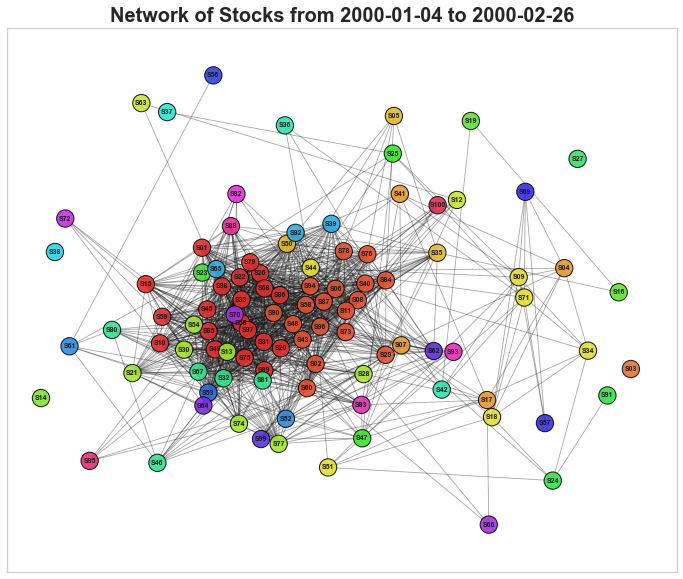

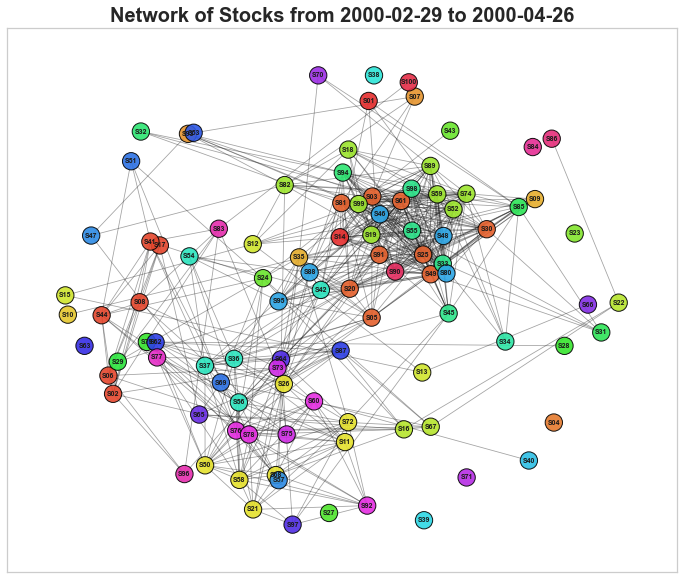

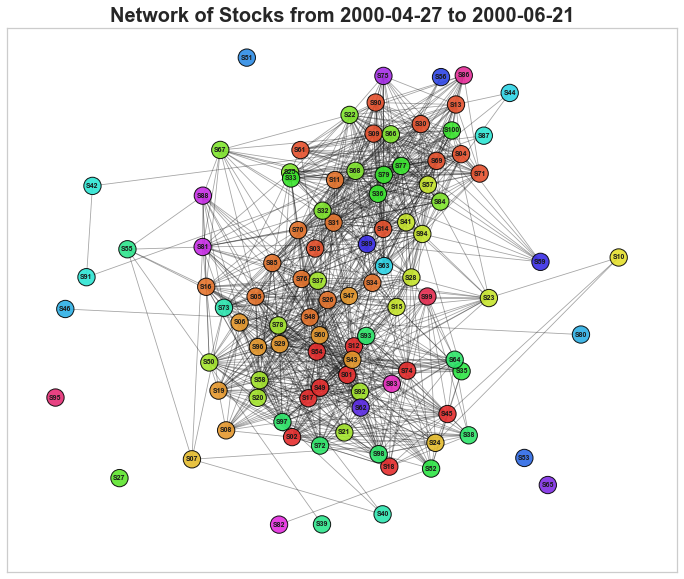

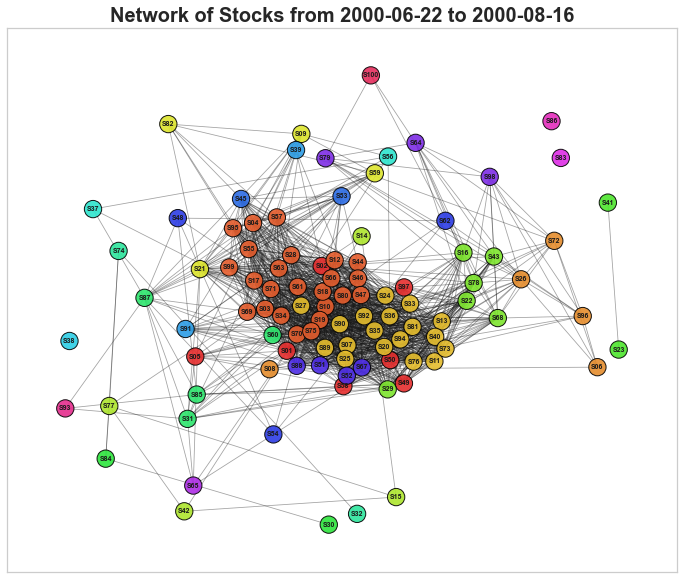

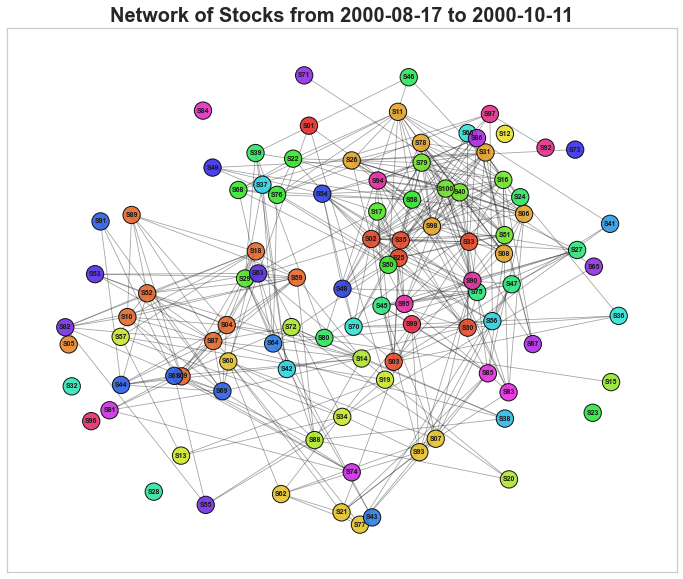

...

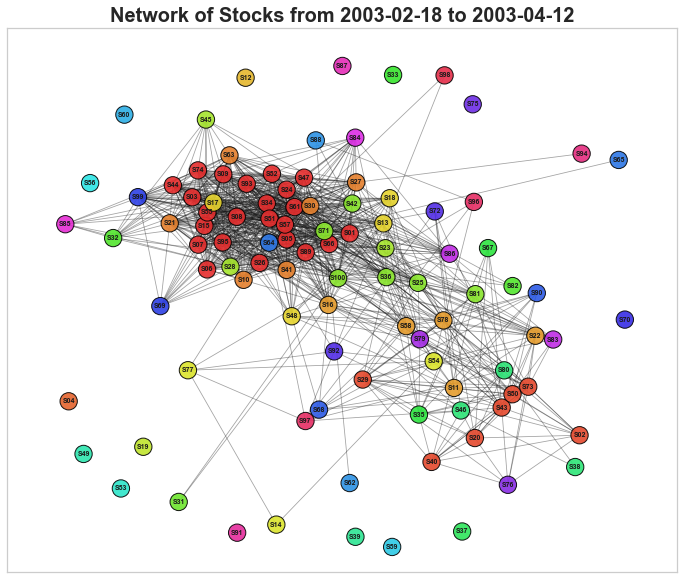

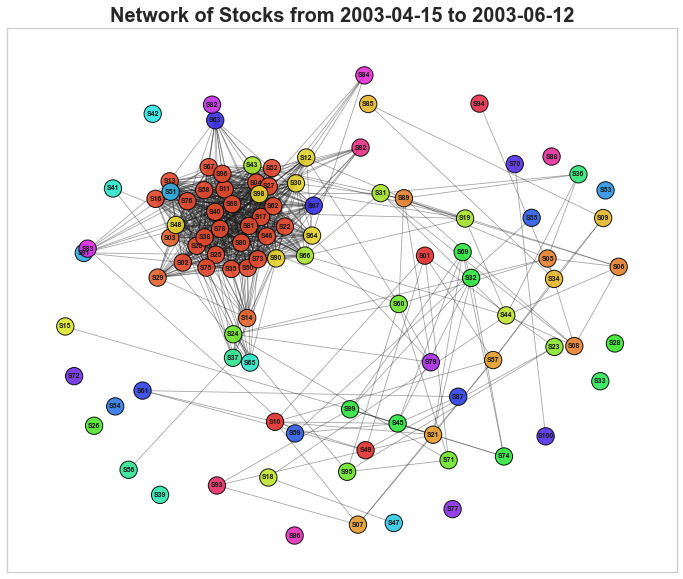

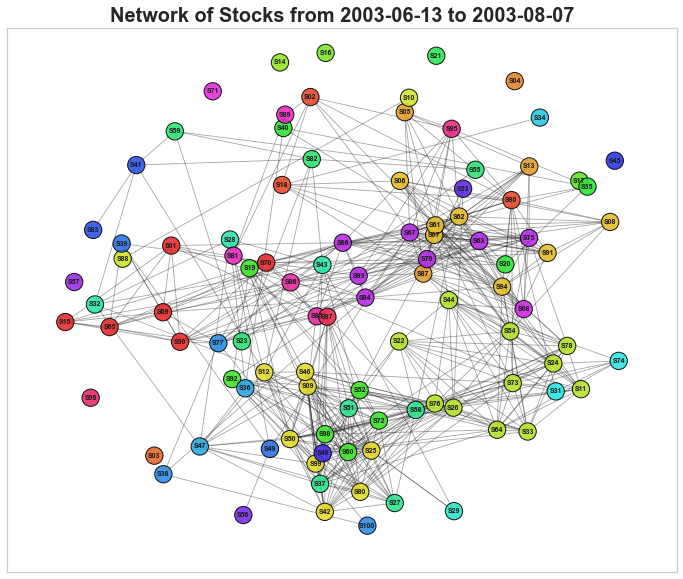

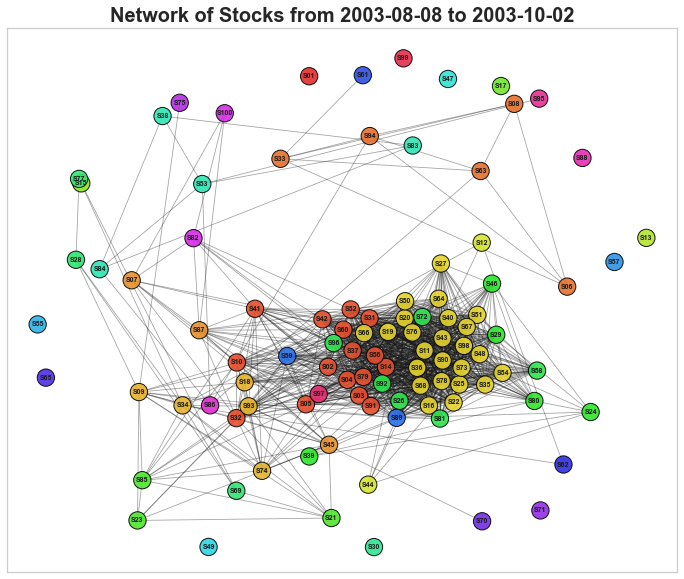

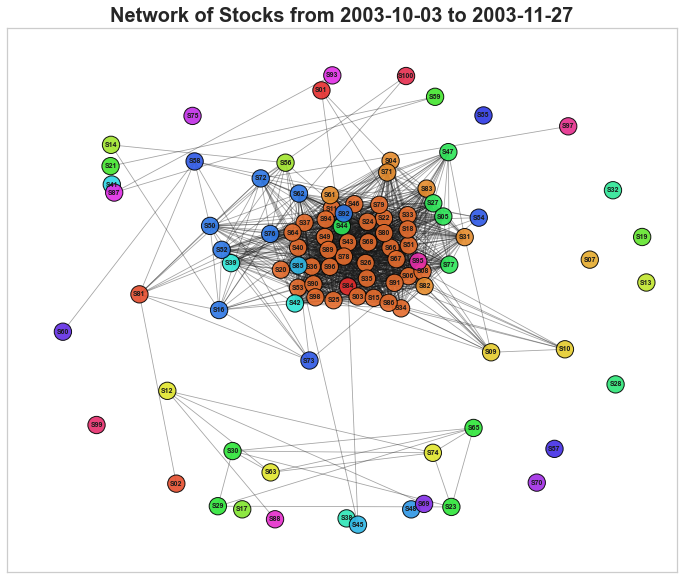

In [77]:
# This cell creates the plots in Figure 9

all_stocks = list(market_by_ticker.columns)

# I loop over each period in the pre-computed "clusters_by_segment" dictionary
for period, clusters in clusters_by_segment.items():
    start_date, end_date = period
    
    segment = market_by_ticker.loc[start_date:end_date]
    ticker_corr_matrix = segment.corr()
    
    G = nx.Graph()

    # I assign a unique color to each cluster
    num_clusters = len(clusters)
    cluster_colors = []
    for i in range(num_clusters):
        hue = i / num_clusters 
        saturation = 0.8
        value = 0.9
        r, g, b = colorsys.hsv_to_rgb(hue, saturation, value)
        hex_color = "#{:02X}{:02X}{:02X}".format(int(r * 255), int(g * 255), int(b * 255))
        cluster_colors.append(hex_color)

    # This is a mapping from each stock to its cluster index
    stock_cluster_map = {}
    for cluster_idx, cluster in enumerate(clusters):
        for stock in cluster:
            stock_cluster_map[stock] = cluster_idx

    # This adds the nodes with cluster information
    for cluster_idx, cluster in enumerate(clusters):
        for stock in cluster:
            G.add_node(stock, cluster=cluster_idx)

    # This adds edges between stocks if thei correlation is ≥ min_corr
    for i, stock_i in enumerate(all_stocks):
        for j, stock_j in enumerate(all_stocks):
            if i < j and ticker_corr_matrix.loc[stock_i, stock_j] >= min_corr:
                G.add_edge(stock_i, stock_j)

    # This determine the node colours based on their cluster assignment
    node_colors = [cluster_colors[stock_cluster_map[stock]] for stock in G.nodes()]
    
    pos = nx.spring_layout(G, seed=1, k=0.9)
    fig = plt.figure(figsize=(12, 10))
    fig.patch.set_facecolor("white")
    plt.title(f"Network of Stocks from {start_date.date()} to {end_date.date()}", fontsize=20, weight="bold")        
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, alpha=0.9, edgecolors="black")
    nx.draw_networkx_edges(G, pos, alpha=0.4, width=0.8)
    nx.draw_networkx_labels(G, pos, font_size=7, font_weight="bold")
    plt.grid(False)
    
    plt.show()

### 8.4) Backtest of the Dynamic Strategy

In [78]:
# This cell backtests the dynamic trading strategy

current_capital = 1000000 
transaction_cost = 0.001

# This is a list of period keys (which is already sorted by the start date)
periods = list(clusters_by_segment.keys())

# This list will store DataFrames with daily equity for each period
equity_dfs = []

# I iterate over periods starting from the second segment onward
for i in range(1, len(periods)):
    current_period = periods[i]   # e.g. (start_date, end_date) for the current segment. Trading will be done over this period      
    prev_period = periods[i - 1]  # I use the previous period's data to select the best performers

    # I extract market data for the previous period
    mask_prev = (market["dates"] >= prev_period[0]) & (market["dates"] <= prev_period[1])
    market_prev = market.loc[mask_prev]
    
    # I compute the PnL for each ticker over the previous period
    # These PnL's are stored in a dictionary of the form {ticker : pnl}
    ticker_pnl = {}
    for ticker in market_prev["ticker"].unique():
        # I take the data for the given ticker over the previous period
        market_ticker_prev = market_prev[market_prev["ticker"] == ticker]

        # I run the backtest for this ticker               
        pnl_df = backtest_single_ticker(df=market_ticker_prev, target="EOD_position", 
                 threshold=best_threshold, initial_capital=1000000, # this "initial_capital" value is not important (just here)             
                 capital_fraction=1, transaction_cost=transaction_cost)
        
        # I compute the PnL as the percentage change from the first day to the last day
        if pnl_df.empty:
            pnl = -999  # If there is no data, I assign a very low PnL
        else:
            initial_eq = pnl_df['equity'].iloc[0]
            final_eq = pnl_df['equity'].iloc[-1]
            pnl = (final_eq / initial_eq - 1) * 100
        ticker_pnl[ticker] = pnl
        
    # I obtain the clusters of the previous period
    clusters_prev = clusters_by_segment[prev_period]
    best_performers = []
    # For each cluster in the previous period, I select the best performer from the previous period
    for cluster in clusters_prev:
        # I only select tickers in the cluster that had a positive PnL over the previous period
        positive_tickers = [ticker for ticker in cluster if ticker_pnl.get(ticker, -999) > 0]
        if positive_tickers:
            # I choose the ticker with the maximum PnL among those with positive PnL for each cluster    
            best_ticker = max(positive_tickers, key=lambda t: ticker_pnl[t])
            best_performers.append(best_ticker)
    
    #print(f"Current period: {(str(current_period[0].date()), str(current_period[1].date()))}\n") 
    #print(f"Pnl of the strategy applied to each ticker over the previous period: {ticker_pnl}\n")    
    #print(f"Previous-period best performers for each previous-period cluster: {best_performers}\n")
    #print("--------- \n")
    
    # I trade in the current period using the best performers from the previous period
    mask_current = (market["dates"] >= current_period[0]) & (market["dates"] <= current_period[1])
    market_current = market.loc[mask_current]
    
    if best_performers:
        # I invest equally in the best performers
        market_current = market_current[market_current["ticker"].isin(best_performers)]
        initial_capital_per_stock = current_capital / len(best_performers)
        trade_df = backtest_all_tickers(df=market_current, target="EOD_position", 
                   threshold=best_threshold, initial_capital_per_stock=initial_capital_per_stock,
                   capital_fraction=1, transaction_cost=transaction_cost)
        
        
        # I update "current_capital" to the last day's total equity in this period
        # The "* (1-transaction_cost)" is the conservative move outlined in the report
        current_capital = (trade_df["total_equity"].iloc[-1]) * (1-transaction_cost)
    else:
        # If there are no best performers, I essentially hold cash
        trade_dates = sorted(market_current["dates"].unique())
        trade_df = pd.DataFrame({
            "dates": trade_dates,
            "total_equity": [current_capital] * len(trade_dates)
        })
    
    # I rename the "total_equity" column to "equity" for consistency
    trade_df = trade_df.rename(columns={"total_equity": "equity"})
    equity_dfs.append(trade_df[["dates", "equity"]])

# This combines all periods' equity data into one dataframe
df_total_daily_equity = pd.concat(equity_dfs, ignore_index=True)
df_total_daily_equity["returns"] = df_total_daily_equity["equity"].pct_change().fillna(0)

# "total_daily_equity" now contains the daily "dates" and "equity" over all trading periods

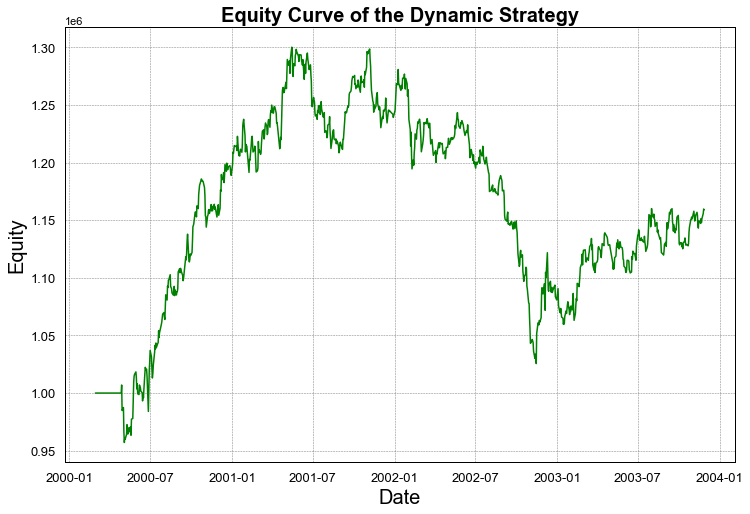

In [79]:
# This cell creates Figure 10

fig = plt.figure(figsize=(12, 8)) 
fig.patch.set_facecolor("white") 
plt.plot(np.array(pd.to_datetime(df_total_daily_equity["dates"])), 
         np.array(df_total_daily_equity["equity"]), color="green")               
plt.xlabel("Date", color="black", fontsize=20)
plt.ylabel("Equity", color="black", fontsize=20)
plt.title("Equity Curve of the Dynamic Strategy",
          color="black", weight="bold", fontsize=20)
plt.grid(color="gray", linestyle="--", linewidth=0.5)
ax = plt.gca() 
ax.set_facecolor("white") 
ax.tick_params(axis="x", colors="black", labelsize=13) 
ax.tick_params(axis="y", colors="black", labelsize=13)  
for spine in ax.spines.values(): 
    spine.set_edgecolor("black") 
    spine.set_linewidth(1)

plt.show()

In [80]:
# These are the results of the dynamic strategy

total_pnl3 = df_total_daily_equity["equity"].iloc[-1] / df_total_daily_equity["equity"].iloc[0] - 1                
annualised_pnl3 = (1+total_pnl3) ** (252/975) - 1
annualised_volatility3 = df_total_daily_equity["returns"].std() * 252**0.5
sharpe_ratio3 = (annualised_pnl3 - 0.03) / annualised_volatility3
print(f"""Dynamic strategy results:
Total PnL: {round(total_pnl3*100, 2)}%
Annualised PnL: {round(annualised_pnl3*100, 2)}%
Annualised volatility: {round(annualised_volatility3*100, 2)}%
Sharpe ratio: {round(sharpe_ratio3, 2)}""")

Dynamic strategy results:
Total PnL: 15.9%
Annualised PnL: 3.89%
Annualised volatility: 9.16%
Sharpe ratio: 0.1
